# EXECUTIVE SUMMARY

1. Optimum Machine Model Chosen: Logistic Regression CLASSIFIER
2. Accuracy Score: 79.54%
3. Cross Validation Score: 80%
4. Final Accuracy Score(After Hyperparamter Tunning): 79.40%
5. AUC Score: 86%
6. Key Operations executed: Exploratory Data Analysis(EDA), Data Preprocessing, Metrics Measurement, Model Execution and Hyperparameter Tunning

# PROBLEM STATEMENT(Insurance Claims- Fraud Detection)

Business case:
Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.
In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 
In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 
 
Note: Use the link below to reach to your dataset. 

Downlaod Files:
https://github.com/dsrscientist/Data-Science-ML-Capstone-Projects/blob/master/Automobile_insurance_fraud.csv

# PROJECT CONTENTS
- Step 1: Attributes of Variables
- Step 2: LOAD DATA SET, DATA DESCRIPTIVE ANALYSIS AND OBSERVATIONS
 - 2.1:Import all necessary libraries
 - 2.2:Load Dataset
 - 2.3:Descriptive Analysis
 - 2.4:Observations
- Step 3: Exploratory Data Analysis
 - 3.1:Normal Distribution Check
 - 3.2:Scatter Plot Check
 - 3.3:Correlation Check
 - 3.4:Outlier Check
 - 3.5:Skewness Check
 - 3.6:Target Variable Check
- Step 4: DATA PREPROCESSING
 - 4.1:Removal of Duplicates
 - 4.2:Arbitrary cutt-off of Target Variable
 - 4.3:Rechecking the current Relationship btw Variable
 - 4.4:Dropping of Features that strongly promotes multicollinearity(VIF)
 - 4.5:Removal of Outliers
 - 4.6:Transforming Data to Remove Skewness using Power transformation
 - 4.7:Seperating the datasets into X and Y variables
- Step 5: MODEL BUILDING
 - 5.1:Logistic Regression
 - 5.2:DecisionTree Classifier
 - 5.3:RandomForest Classifier
 - 5.4:AdaBoost Classifier
 - 5.5:GradientBoosting Classifier
 - 5.6:XGBoost Classifier
 - 5.7:ExtraTrees Classifier
 - 5.8:Support Vector Classifier(SVC)
- Step 6:COMPARING ALL MACHINE LEARNING MODELS
 - 6.1:Comparing Differences between Accuracy and Cross_Validation Scores...
 - 6.2:Conclusion on Choice of Model
- Step 7:HYPERPARAMETER TUNNING
- Step 8:ROC AUC PLOT
- Step 9:MODEL SAVING

# Step 1 - ATTRIBUTES OF VARIABLES

1. months_as_customer                
2. age                               
3. policy_number                     
4. policy_bind_date                  
5. policy_state                     
6. policy_csl                        
7. policy_deductable                 
8. policy_annual_premium          
9. umbrella_limit                    
10. insured_zip                       
11. insured_sex                       
12. insured_education_level           
13. insured_occupation                
14. insured_hobbies                   
15. insured_relationship             
16. capital-gains                  
17. capital-loss                  
18. incident_date                 
19. incident_type                    
20. collision_type                 
21. incident_severity             
22. authorities_contacted          
23. incident_state                 
24. incident_city                    
25. incident_location              
26. incident_hour_of_the_day       
27. number_of_vehicles_involved
28. property_damage                 
29. bodily_injuries             
30. witnesses                        
31. police_report_available         
32. total_claim_amount             
33. injury_claim                      
34. property_claim                  
35. vehicle_claim                  
36. auto_make                        
37. auto_model                       
38. auto_year                       
39. fraud_reported           

# Step 2 - IMPORT ALL NECESSARY LIBRARIES, LOAD DATA SET, DATA DESCRIPTIVE ANALYSIS AND OBSERVATIONS

# Step 2.1 - Import all necessary libraries

In [6]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV, RandomizedSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, classification_report, plot_roc_curve
from scipy.stats import zscore
from sklearn.preprocessing import power_transform, PowerTransformer
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn import metrics
import seaborn as sns
import matplotlib.pyplot as plt
import pickle

import warnings
warnings.filterwarnings('ignore')

# Step 2.2 - Load Dataset

In [7]:
#Load dataset
df=pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')

In [8]:
#checking the first five rows
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [9]:
#checking the last five rows
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN
999,456,60,556080,11-11-1996,OH,250/500,1000,766.19,0,612260,...,?,5060,460,920,3680,Mercedes,E400,2007,N,NaN


In [10]:
#picking 4 random samples
df.sample(4)

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
890,145,34,454758,20-05-1990,IN,100/300,1000,1142.48,0,608813,...,NO,52250,9500,4750,38000,Suburu,Legacy,2012,N,NaN
983,17,39,774895,28-10-2006,IL,250/500,1000,840.95,0,431202,...,?,3440,430,430,2580,Suburu,Legacy,2002,N,NaN
107,118,28,283414,28-12-1991,IN,500/1000,2000,1207.36,0,432896,...,?,74200,7420,14840,51940,Volkswagen,Passat,1997,N,NaN
609,463,57,407958,20-07-1991,IL,250/500,500,1063.67,0,463356,...,YES,59400,6600,6600,46200,Dodge,Neon,1995,N,NaN


# Step 2.3 - Data Descriptive Analysis

In [11]:
#checking the data shape
# One thing to note is that machine learning algorthms begins to perform poorly as the number of features begins to increase.
#This is called the curse of dimensionality
#We will employ techniques to engineer the features and reduce the dimension for better performance
df.shape

(1000, 40)

In [12]:
#checking for nature of datatypes
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [13]:
#Checking data info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [14]:
#Checking data full description or statistics of the dataset
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


In [15]:
#lets check the columns
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [16]:
#Checking for null values
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [17]:
#Checking for null values
df.isnull().sum().sum()

1000

In [18]:
#Checking data description for all non-numerical columns
numerics = ['int8','int16','int32','int64','float16','float32','float64']#enlisiting and storing possible data types of continuous data. This means any continuous data MUST have any of this type of data type
categorical_columns=[]#initializing an emty list
features = df.columns.values.tolist()#Pulling all the features(columns) of the dataset and storing in features
for col in features:#col is the iterating variable
    if df[col].dtype in numerics:
        continue
    categorical_columns.append(col)
df[categorical_columns].describe()

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,...,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,951,3,3,2,7,14,20,6,60,4,...,4,5,7,7,1000,3,3,14,39,2
top,01-01-2006,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,02-02-2015,Multi-vehicle Collision,...,Minor Damage,Police,NY,Springfield,9935 4th Drive,?,?,Saab,RAM,N
freq,3,352,351,537,161,93,64,183,28,419,...,354,292,262,157,1,360,343,80,43,753


In [19]:
for column in df[categorical_columns]:
    print(column)

policy_bind_date
policy_state
policy_csl
insured_sex
insured_education_level
insured_occupation
insured_hobbies
insured_relationship
incident_date
incident_type
collision_type
incident_severity
authorities_contacted
incident_state
incident_city
incident_location
property_damage
police_report_available
auto_make
auto_model
fraud_reported


In [20]:
#Checking the content of each Categorical columns
print("The Value Counts in policy_bind_date - ",Counter(df['policy_bind_date']))
print("The Value Counts in policy_state - ",Counter(df['policy_state']))
print("The Value Counts in policy_csl - ",Counter(df['policy_csl']))
print("The Value Counts in insured_sex - ",Counter(df['insured_sex']))
print("The Value Counts in insured_education_level - ",Counter(df['insured_education_level']))
print("The Value Counts in insured_occupation - ",Counter(df['insured_occupation']))
print("The Value Counts in insured_hobbies - ",Counter(df['insured_hobbies']))
print("The Value Counts in insured_relationship - ",Counter(df['insured_relationship']))
print("The Value Counts in incident_date - ",Counter(df['incident_date']))
print("The Value Counts in incident_type - ",Counter(df['incident_type']))
print("The Value Counts in collision_type - ",Counter(df['collision_type']))
print("The Value Counts in incident_severity - ",Counter(df['incident_severity']))
print("The Value Counts in incident_state- ",Counter(df['incident_state']))
print("The Value Counts in incident_location - ",Counter(df['incident_location']))
print("The Value Counts in property_damage - ",Counter(df['property_damage']))
print("The Value Counts in police_report_available - ",Counter(df['police_report_available']))
print("The Value Counts in auto_make - ",Counter(df['auto_make']))
print("The Value Counts in auto_model - ",Counter(df['auto_model']))
print("The Value Counts in fraud_reported - ",Counter(df['fraud_reported']))


The Value Counts in policy_bind_date -  Counter({'01-01-2006': 3, '05-08-1992': 3, '28-04-1992': 3, '25-05-1990': 2, '04-06-2000': 2, '20-09-1990': 2, '09-03-2003': 2, '11-11-1998': 2, '28-12-2002': 2, '14-04-1992': 2, '15-05-1997': 2, '07-12-1999': 2, '28-12-1991': 2, '04-05-2000': 2, '29-09-1999': 2, '27-07-2014': 2, '08-11-2009': 2, '21-09-1996': 2, '14-07-1997': 2, '07-07-1996': 2, '05-07-2014': 2, '28-01-2010': 2, '21-12-2002': 2, '07-12-1995': 2, '11-03-2010': 2, '19-09-1995': 2, '03-02-1997': 2, '09-07-2002': 2, '25-09-2001': 2, '16-07-2002': 2, '22-08-1991': 2, '21-09-2005': 2, '07-04-1999': 2, '06-05-2007': 2, '14-12-1991': 2, '16-05-2008': 2, '03-01-2004': 2, '25-12-2013': 2, '07-11-1997': 2, '09-08-2004': 2, '20-07-1991': 2, '30-08-1993': 2, '29-01-1998': 2, '05-01-1992': 2, '15-11-1997': 2, '24-06-1990': 2, '17-10-2014': 1, '27-06-2006': 1, '06-09-2000': 1, '06-06-2014': 1, '12-10-2006': 1, '03-02-1990': 1, '05-02-1997': 1, '25-07-2011': 1, '26-05-2002': 1, '29-05-1999': 1,

In [21]:
#Checking the content of each Categorical columns
#This is the target and as we can see the dataset is imbalanced therefore we will employ techniques to balance in this dataas we proceed withour solution
df.fraud_reported.value_counts()



N    753
Y    247
Name: fraud_reported, dtype: int64

In [22]:
#Checking the content of each Categorical columns
df.auto_model.value_counts()


RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64

In [23]:
#Checking the content of each Categorical columns
df.auto_make.value_counts()


Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64

In [24]:
#Checking the content of each Categorical columns
df.police_report_available.value_counts()


?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

In [25]:
#Checking the content of each Categorical columns
df.property_damage.value_counts()


?      360
NO     338
YES    302
Name: property_damage, dtype: int64

In [26]:
#Checking the content of each Categorical columns
df.incident_location.value_counts()


9935 4th Drive         1
4214 MLK Ridge         1
8548 Cherokee Ridge    1
2352 MLK Drive         1
9734 2nd Ridge         1
                      ..
6770 1st St            1
4119 Texas St          1
4347 2nd Ridge         1
1091 1st Drive         1
1416 Cherokee Ridge    1
Name: incident_location, Length: 1000, dtype: int64

In [27]:
#Checking the content of each Categorical columns
df.incident_state.value_counts()


NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64

In [28]:
#Checking the content of each Categorical columns
df.incident_severity.value_counts()


Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64

In [29]:
#Checking the content of each Categorical columns
df.collision_type.value_counts()


Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

In [30]:
#Checking the content of each Categorical columns
df.incident_type.value_counts()


Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64

In [31]:
#Checking the content of each Categorical columns
df.incident_date.value_counts()


02-02-2015    28
17-02-2015    26
07-01-2015    25
10-01-2015    24
04-02-2015    24
24-01-2015    24
19-01-2015    23
08-01-2015    22
13-01-2015    21
30-01-2015    21
12-02-2015    20
22-02-2015    20
31-01-2015    20
06-02-2015    20
21-02-2015    19
01-01-2015    19
23-02-2015    19
12-01-2015    19
14-01-2015    19
21-01-2015    19
03-01-2015    18
14-02-2015    18
01-02-2015    18
28-02-2015    18
20-01-2015    18
18-01-2015    18
25-02-2015    18
06-01-2015    17
09-01-2015    17
08-02-2015    17
24-02-2015    17
26-02-2015    17
13-02-2015    16
15-02-2015    16
16-02-2015    16
05-02-2015    16
16-01-2015    16
17-01-2015    15
18-02-2015    15
28-01-2015    15
15-01-2015    15
22-01-2015    14
20-02-2015    14
27-02-2015    14
23-01-2015    13
03-02-2015    13
27-01-2015    13
09-02-2015    13
04-01-2015    12
01-03-2015    12
26-01-2015    11
29-01-2015    11
02-01-2015    11
19-02-2015    10
11-02-2015    10
10-02-2015    10
07-02-2015    10
25-01-2015    10
11-01-2015    

In [32]:
#Checking the content of each Categorical columns
df.insured_relationship.value_counts()


own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64

In [33]:
#Checking the content of each Categorical columns
df.insured_hobbies.value_counts()


reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64

In [35]:
#Checking the content of each Categorical columns
df.insured_occupation.value_counts()


machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64

In [36]:
#Checking the content of each Categorical columns
df.insured_education_level.value_counts()


JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64

In [37]:
#Checking the content of each Categorical columns
df.insured_sex.value_counts()


FEMALE    537
MALE      463
Name: insured_sex, dtype: int64

In [38]:
#Checking the content of each Categorical columns
df.policy_csl.value_counts()

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64

In [39]:
#Checking the content of each Categorical columns
df.policy_state.value_counts()

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64

In [40]:
#Checking the content of each Categorical columns
df.policy_bind_date.value_counts()

01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64

In [41]:
#Checking the goemetry of the Target column
from collections import Counter
print("The Value Counts in fraud_reported - ",Counter(df['fraud_reported']))

The Value Counts in fraud_reported -  Counter({'N': 753, 'Y': 247})


In [42]:
#Checking the count
df['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

In [43]:
df.shape

(1000, 40)

In [44]:
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

# Step 2.4 - Observations


# The Train Dataset is made up of;
- 1000 rows and 40 columns
- 39 features and 1 Target
       'months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported
# Description of Features:
1   months_as_customer:
    - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
 2   age      
     - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 3   policy_number
     - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 4   policy_bind_date     
     - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 5   policy_state     
     - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 6   policy_csl        
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 7   policy_deductable      
     - It has no null values
     - Its Datatype is a floating type
    - It is made up of Continuos data
    
 8   policy_annual_premium 
    - Its Datatype is a object type
    - It is made up of categorical data
    
 9  umbrella_limit
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 10  insured_zip
     - It has no null values
    - Its Datatype is a floating type
    - It is made up of Continuos data
    
 11  insured_sex
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 12  insured_education_level
     - It has no null values
    - Its Datatype is a object type
    - It is made up of categorical data
    
 13  insured_occupation
      - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 14  insured_hobbies
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 15  insured_relationship 
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 16 capital-gains
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 17  capital-loss
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 18  incident_date  
     - It has no null values
    - Its Datatype is a floating type
    - It is made up of Continuos data
    
 19  incident_type
     - It has no null values
    - Its Datatype is a floating type
    - It is made up of Continuos data
    
 20  collision_type
     - It has no null values
    - Its Datatype is a object type
    - It is made up categorical data
 
 21  incident_severity:
    - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 22  incident_state  
     - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 23  incident_city  
     - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 24  incident_location 
     - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 25   incident_hour_of_the_day        
     - It has no null values
     - Its Datatype is a object type
    - It is made up of Categorical data
    
 26  number_of_vehicles_involved       
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 27  property_damage     
     - It has no null values
     - Its Datatype is a floating type
    - It is made up of Continuos data
    
 28  bodily_injuries
    - Its Datatype is a object type
    - It is made up of categorical data
    
 29  witnesses
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 30  police_report_available 
     - It has no null values
    - Its Datatype is a floating type
    - It is made up of Continuos data
    
 31  total_claim_amount
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 32  injury_claim
     - It has no null values
    - Its Datatype is a object type
    - It is made up of categorical data
    
 33  property_claim
    - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 34  vehicle_claim
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 35  auto_make
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 36  auto_model 
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 37  auto_year 
     - It has no null values
    - Its Datatype is a object type
    - It is made up of Categorical data
    
 38  fraud_reported  
     - It has no null values
    - Its Datatype is a floating type
    - It is made up of Continuos data
    
 
# About the Target/Label:
39  fraud_reported
     - It has no null values
    - Its Datatype is a floating type
    - It is made up of Continuos data
    
**Since the target is made up of a categorica;l data hence this is a CLASSIFICATION PROBLEM!

# Step 3 - EXPLORATORY DATA ANALYSIS(EDA) AND VISUALIZATION
The objectives of the EDA is to ensure;
1. Independent Features will have a normal distribution using Data Transformation to remove skewness
2. Datasets will have the same scale using Normalization and Standardization
3. Column mean will be zero
4. Standard Deviation of the data should be 1

# Step 3.1 Count Distribution of Categorical Data - Univariate Analysis

01-01-2006    3
28-04-1992    3
05-08-1992    3
14-12-1991    2
09-08-2004    2
             ..
03-06-2014    1
12-12-1998    1
18-02-1999    1
30-10-1997    1
11-11-1996    1
Name: policy_bind_date, Length: 951, dtype: int64


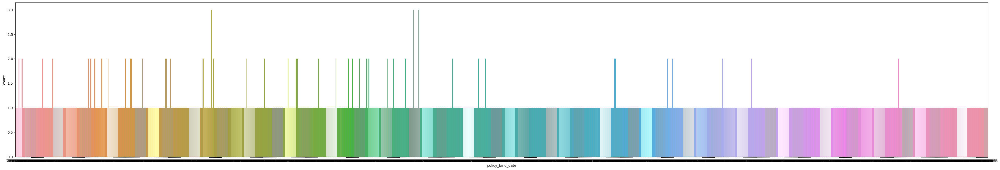

In [45]:

plt.figure(figsize=(50,8))
ax=sns.countplot(x='policy_bind_date',data=df)
print(df['policy_bind_date'].value_counts())

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


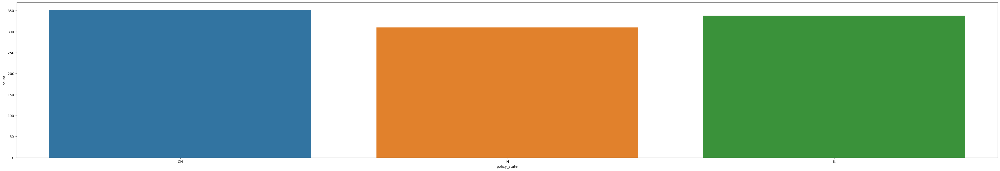

In [46]:
# From the visualisation below we can see that the cases reported in ohio,illinois and IN are distributed equally almost similar numbers or cases.
# As you can see from the count between the three locations its an average of 333 per location.
# So the cases are evely balanced
plt.figure(figsize=(50,8))
ax=sns.countplot(x='policy_state',data=df)
print(df['policy_state'].value_counts())

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


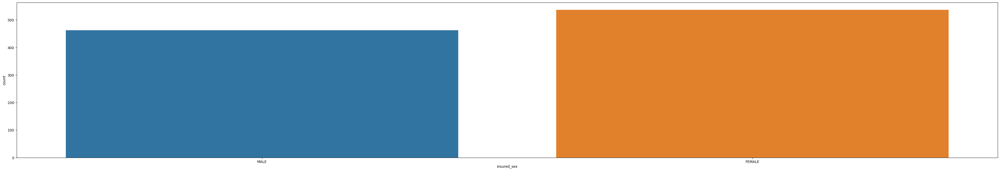

In [47]:
#From the visualisation below we can see that we had more females involved than males
#But in general the count or number is balanced

plt.figure(figsize=(50,8))
ax=sns.countplot(x='insured_sex',data=df)
print(df['insured_sex'].value_counts())

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


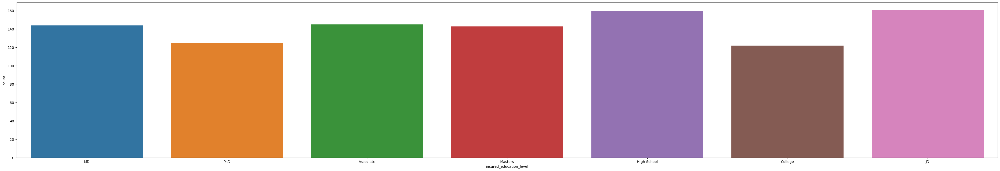

In [48]:
#From the visualisation below we can see that less cases was recored from people with college degrees
#More of the cases recorded were from the the JD and highschool individuals
plt.figure(figsize=(50,8))
ax=sns.countplot(x='insured_education_level',data=df)
print(df['insured_education_level'].value_counts())

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


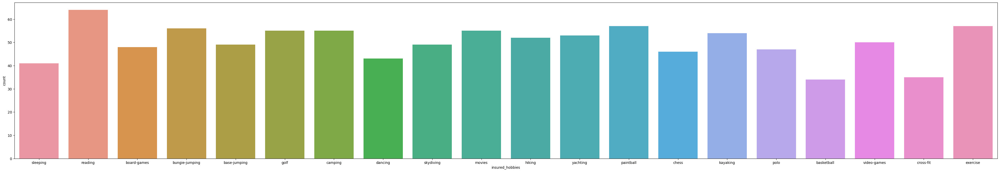

In [49]:
plt.figure(figsize=(50,8))
ax=sns.countplot(x='insured_hobbies',data=df)
print(df['insured_hobbies'].value_counts())

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


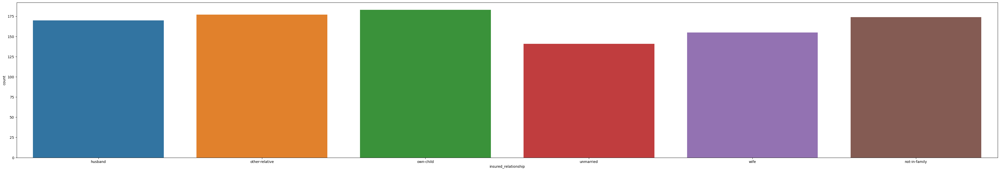

In [50]:
#From the visualisation below we can see that the unmarried had the lowest count or records and those that owned a child,other relative and not in family had majority of the cases.
#Those that owned child had more cases(183) compared to 141 for those that were unmarried
plt.figure(figsize=(50,8))
ax=sns.countplot(x='insured_relationship',data=df)
print(df['insured_relationship'].value_counts())

02-02-2015    28
17-02-2015    26
07-01-2015    25
10-01-2015    24
04-02-2015    24
24-01-2015    24
19-01-2015    23
08-01-2015    22
13-01-2015    21
30-01-2015    21
12-02-2015    20
22-02-2015    20
31-01-2015    20
06-02-2015    20
21-02-2015    19
01-01-2015    19
23-02-2015    19
12-01-2015    19
14-01-2015    19
21-01-2015    19
03-01-2015    18
14-02-2015    18
01-02-2015    18
28-02-2015    18
20-01-2015    18
18-01-2015    18
25-02-2015    18
06-01-2015    17
09-01-2015    17
08-02-2015    17
24-02-2015    17
26-02-2015    17
13-02-2015    16
15-02-2015    16
16-02-2015    16
05-02-2015    16
16-01-2015    16
17-01-2015    15
18-02-2015    15
28-01-2015    15
15-01-2015    15
22-01-2015    14
20-02-2015    14
27-02-2015    14
23-01-2015    13
03-02-2015    13
27-01-2015    13
09-02-2015    13
04-01-2015    12
01-03-2015    12
26-01-2015    11
29-01-2015    11
02-01-2015    11
19-02-2015    10
11-02-2015    10
10-02-2015    10
07-02-2015    10
25-01-2015    10
11-01-2015    

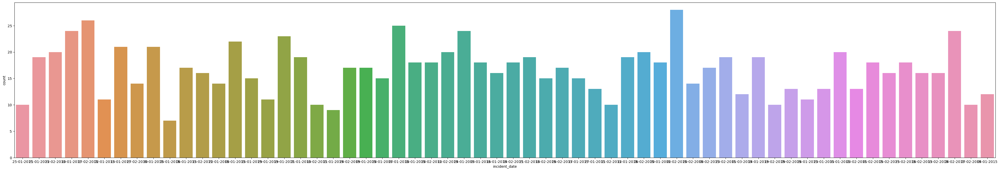

In [51]:
#From the visualisation below all the cases recorded were within three months from january to march of 2015
#so in three months we has 247 reported fraud cases

plt.figure(figsize=(50,8))
ax=sns.countplot(x='incident_date',data=df)
print(df['incident_date'].value_counts())

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


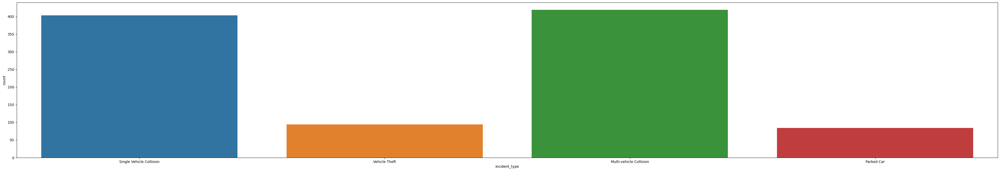

In [52]:
#From the visualisation below majority of the cases were mulit vehicle collision and single vehicle collision.The least number of cases was the case of car thef


plt.figure(figsize=(50,8))
ax=sns.countplot(x='incident_type',data=df)
print(df['incident_type'].value_counts())

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64


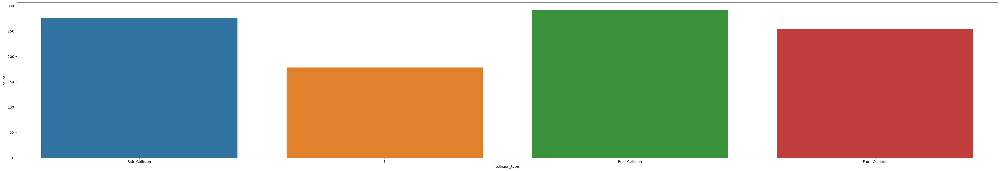

In [53]:
#We had more rear collisions,i.e collision from the back compared to the other types of collision like side,front and 178 unclassified collisions

plt.figure(figsize=(50,8))
ax=sns.countplot(x='collision_type',data=df)
print(df['collision_type'].value_counts())

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


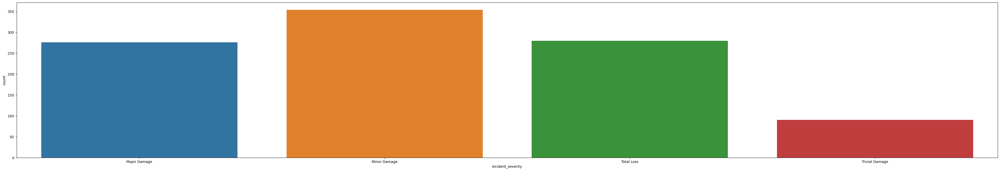

In [54]:
#From te visualisation below we had more minor damages than trivial damages.#
# we also had a total loss of 280 which makes up 28% of the total incident severity


plt.figure(figsize=(50,8))
ax=sns.countplot(x='incident_severity',data=df)
print(df['incident_severity'].value_counts())

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


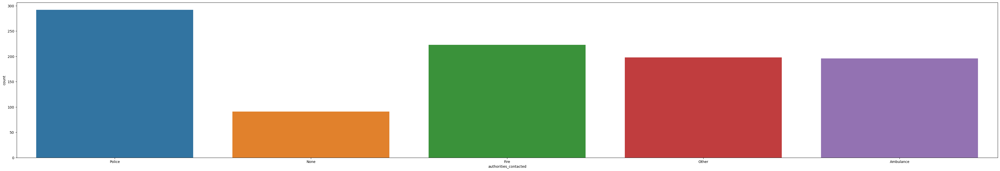

In [55]:
#From the visualisation below most of the cases were reported to the police compared to other government authorities
#This makes up 29% of the cases were reported to the police authorities

plt.figure(figsize=(50,8))
ax=sns.countplot(x='authorities_contacted',data=df)
print(df['authorities_contacted'].value_counts())

NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


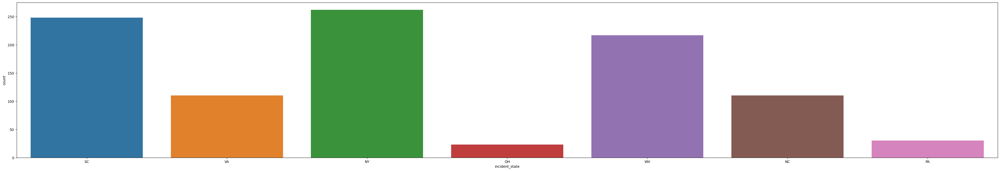

In [56]:

#From the visualisation below we had most of the incidents in newyork which makes up 26% of the total cases and the least reported cases was in ohio a 2.3% of the total record.
plt.figure(figsize=(50,8))
ax=sns.countplot(x='incident_state',data=df)
print(df['incident_state'].value_counts())

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


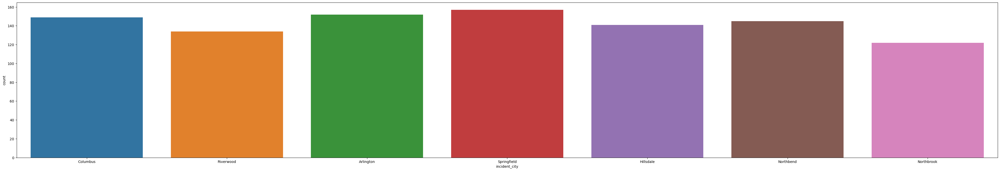

In [57]:
#from the visualisation below the recorded cases in the cities are evenly distributed with springfield have more of the cases and nortbrook having the least

plt.figure(figsize=(50,8))
ax=sns.countplot(x='incident_city',data=df)
print(df['incident_city'].value_counts())

9935 4th Drive         1
4214 MLK Ridge         1
8548 Cherokee Ridge    1
2352 MLK Drive         1
9734 2nd Ridge         1
                      ..
6770 1st St            1
4119 Texas St          1
4347 2nd Ridge         1
1091 1st Drive         1
1416 Cherokee Ridge    1
Name: incident_location, Length: 1000, dtype: int64


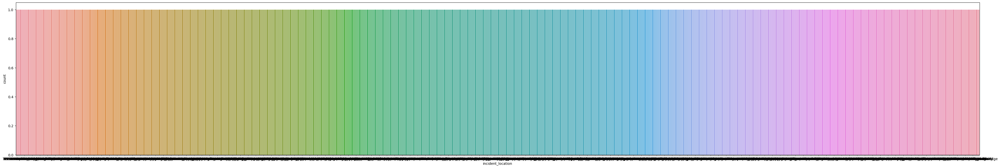

In [58]:


plt.figure(figsize=(50,8))
ax=sns.countplot(x='incident_location',data=df)
print(df['incident_location'].value_counts())

?      360
NO     338
YES    302
Name: property_damage, dtype: int64


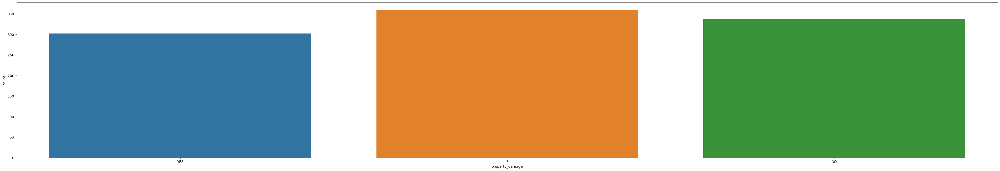

In [59]:
#From the visualisation below we can seee that only 30% of the record led to damage of property
#Although another 36% didnt capture whether if it led to damage or  not.

plt.figure(figsize=(50,8))
ax=sns.countplot(x='property_damage',data=df)
print(df['property_damage'].value_counts())

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64


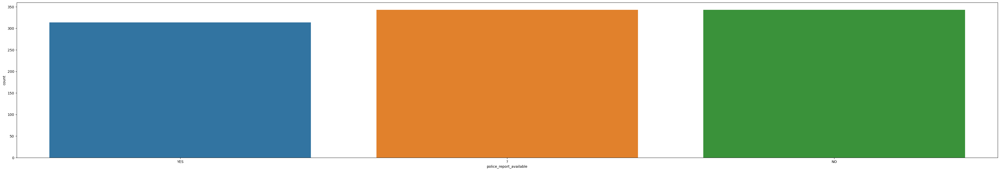

In [60]:
#from the visualisation below only 31% of the cases had police report available
#Another 34% didnt capture whether the police report was available or not

plt.figure(figsize=(50,8))
ax=sns.countplot(x='police_report_available',data=df)
print(df['police_report_available'].value_counts())

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


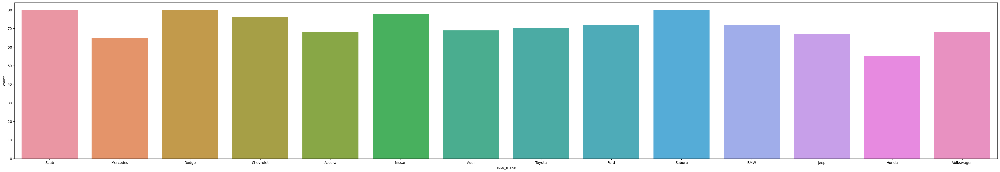

In [61]:
#From the visualisation below we can see that saab,dodge and subaru had more cases compared to honda which had the least reported cases
plt.figure(figsize=(50,8))
ax=sns.countplot(x='auto_make',data=df)
print(df['auto_make'].value_counts())

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


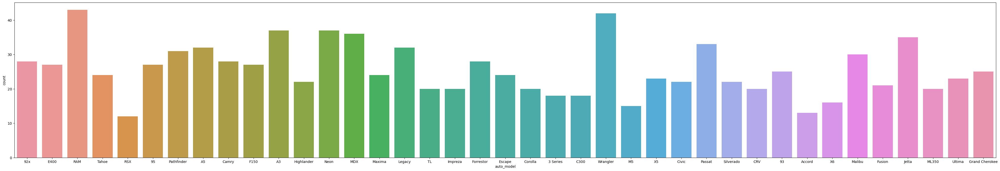

In [62]:

plt.figure(figsize=(50,8))
ax=sns.countplot(x='auto_model',data=df)
print(df['auto_model'].value_counts())

N    753
Y    247
Name: fraud_reported, dtype: int64


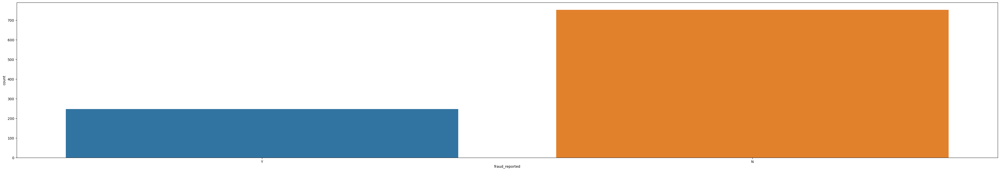

In [63]:
#From the visualisation below we have an imbalanced dataset and we will employ techniques to balance the data.
#Either we employ oversampling or undersampling techniques
plt.figure(figsize=(50,8))
ax=sns.countplot(x='fraud_reported',data=df)
print(df['fraud_reported'].value_counts())

In [64]:
#fraud_reported yes dataset
fraud_reported_yes=pd.DataFrame(df.query('fraud_reported == "Yes"'))

#fraud_reported no dataset
fraud_reported_no=pd.DataFrame(df.query('fraud_reported == "No"'))

In [65]:
import plotly.graph_objects as go
# To see the values in each category
fraud_reported_yes['policy_state'].value_counts() #print this result separately

#Plotting the values
colors = ['cadetblue','powderblue']

#Using the values for yes and no that we obtained from the above code
fraud_reported_pie1 = go.Figure(data=[go.Pie(labels = ['Yes','No'],
                             values =['476','1393'],pull=[0.3, 0, 0, 0])])
fraud_reported_pie1.update_traces(hoverinfo='label+percent', textinfo='value+percent', textfont_size=20, marker=dict(colors=colors))
fraud_reported_pie1.show()

# Observations Univariate Analysis on Categorical Data 
From the above count plots 
From the visualisations above the observations have been recorded in each respective cell.
#From the visualisation below we have an imbalanced dataset and we will employ techniques to balance the data.
#Either we employ oversampling or undersampling techniques
#From the visualisation below we can see that saab,dodge and subaru had more cases compared to honda which had the least reported cases
#from the visualisation below only 31% of the cases had police report available
#Another 34% didnt capture whether the police report was available or not
#From the visualisation below we can seee that only 30% of the record led to damage of property
#Although another 36% didnt capture whether if it led to damage or  not.
#from the visualisation below the recorded cases in the cities are evenly distributed with springfield have more of the cases and nortbrook having the least

#From the visualisation below we had most of the incidents in newyork which makes up 26% of the total cases and the least reported cases was in ohio a 2.3% of the total record
#From the visualisation below most of the cases were reported to the police compared to other government authorities
#This makes up 29% of the cases were reported to the police authorities
#From te visualisation below we had more minor damages than trivial damages.#
#we also had a total loss of 280 which makes up 28% of the total incident severity
#We had more rear collisions,i.e collision from the back compared to the other types of collision like side,front and 178 unclassified collisions
From the visualisation below we can see that the cases reported in ohio,illinois and IN are distributed equally almost similar numbers or cases.
#As you can see from the count between the three locations its an average of 333 per location.
#So the cases are evenly balance

#From the visualisation below we can see that we had more females involved than males
#But in general the count or number is balanced

#From the visualisation below we can see that less cases was recored from people with college degrees
#More of the cases recorded were from the the JD and highschool individuals

#From the visualisation below we can see that the unmarried had the lowest count or records and those that owned a child,other relative and not in family had majority of the cases.
#Those that owned child had more cases(183) compared to 141 for those that were unmarried

#From the visualisation below all the cases recorded were within three months from january to march of 2015
#so in three months we has 247 reported fraud cases

#From the visualisation below majority of the cases were mulit vehicle collision and single vehicle collision.The least number of cases was the case of car theft





# Step 3.2 Updating Null values

In [66]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [67]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

 # Observations on Null Update 
From the above we can see that _c39 is not needed so we might have to drop it. 

In [68]:
# lets examin for null values again:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

# Observations on Null Update 
From the above we can see that there are no null values

In [69]:
df.drop(columns='_c39',axis=1,inplace=True)
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


# Step 3.3 Encoding
- We cannot perform Exploratory Data Analysis on Non-numerical Data, so we have to first of all convert them to numerical data
- Here we shall adopt Ordinal Encoder to transform the all Non-numerical column into Numerical Data!

In [70]:
#initializing....

from sklearn.preprocessing import OrdinalEncoder
enc=OrdinalEncoder()

In [71]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


In [72]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

In [73]:
#Tranforming into numerical data
for i in df.columns:
    if df[i].dtypes=='object':
        df[i]=enc.fit_transform(df[i].values.reshape(-1,1))

In [74]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,532.0,2.0,1.0,1000,1406.91,0,466132,...,2,2.0,71610,6510,13020,52080,10.0,1.0,2004,1.0
1,228,42,342868,821.0,1.0,1.0,2000,1197.22,5000000,468176,...,0,0.0,5070,780,780,3510,8.0,12.0,2007,1.0
2,134,29,687698,186.0,2.0,0.0,2000,1413.14,5000000,430632,...,3,1.0,34650,7700,3850,23100,4.0,30.0,2007,0.0
3,256,41,227811,766.0,0.0,1.0,2000,1415.74,6000000,608117,...,2,1.0,63400,6340,6340,50720,3.0,34.0,2014,1.0
4,228,44,367455,181.0,0.0,2.0,1000,1583.91,6000000,610706,...,1,1.0,6500,1300,650,4550,0.0,31.0,2009,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,487.0,2.0,2.0,1000,1310.80,0,431289,...,1,0.0,87200,17440,8720,61040,6.0,6.0,2006,0.0
996,285,41,186934,129.0,0.0,0.0,1000,1436.79,0,608177,...,3,0.0,108480,18080,18080,72320,13.0,28.0,2015,0.0
997,130,34,918516,509.0,2.0,1.0,500,1383.49,3000000,442797,...,3,2.0,67500,7500,7500,52500,11.0,19.0,1996,0.0
998,458,62,533940,573.0,0.0,2.0,2000,1356.92,5000000,441714,...,1,2.0,46980,5220,5220,36540,1.0,5.0,1998,0.0


In [75]:
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,532.0,2.0,1.0,1000,1406.91,0,466132,...,2,2.0,71610,6510,13020,52080,10.0,1.0,2004,1.0
1,228,42,342868,821.0,1.0,1.0,2000,1197.22,5000000,468176,...,0,0.0,5070,780,780,3510,8.0,12.0,2007,1.0
2,134,29,687698,186.0,2.0,0.0,2000,1413.14,5000000,430632,...,3,1.0,34650,7700,3850,23100,4.0,30.0,2007,0.0
3,256,41,227811,766.0,0.0,1.0,2000,1415.74,6000000,608117,...,2,1.0,63400,6340,6340,50720,3.0,34.0,2014,1.0
4,228,44,367455,181.0,0.0,2.0,1000,1583.91,6000000,610706,...,1,1.0,6500,1300,650,4550,0.0,31.0,2009,0.0


In [76]:
df.sample()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
671,250,43,687755,845.0,0.0,2.0,2000,1539.06,0,434150,...,3,0.0,64200,10700,10700,42800,5.0,14.0,2002,0.0


In [77]:
df.tail()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
995,3,38,941851,487.0,2.0,2.0,1000,1310.80,0,431289,...,1,0.0,87200,17440,8720,61040,6.0,6.0,2006,0.0
996,285,41,186934,129.0,0.0,0.0,1000,1436.79,0,608177,...,3,0.0,108480,18080,18080,72320,13.0,28.0,2015,0.0
997,130,34,918516,509.0,2.0,1.0,500,1383.49,3000000,442797,...,3,2.0,67500,7500,7500,52500,11.0,19.0,1996,0.0
998,458,62,533940,573.0,0.0,2.0,2000,1356.92,5000000,441714,...,1,2.0,46980,5220,5220,36540,1.0,5.0,1998,0.0
999,456,60,556080,359.0,2.0,1.0,1000,766.19,0,612260,...,3,0.0,5060,460,920,3680,8.0,12.0,2007,0.0


In [78]:
df.describe()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,...,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,474.332000,1.01400,0.951000,1136.000000,1256.406150,1.101000e+06,501214.488000,...,1.487000,0.971000,52761.94000,7433.420000,7399.570000,37928.950000,6.546000,19.318000,2005.103000,0.247000
std,115.113174,9.140287,257063.005276,275.402851,0.83096,0.804516,611.864673,244.167395,2.297407e+06,71701.610941,...,1.111335,0.810442,26401.53319,4880.951853,4824.726179,18886.252893,4.034869,11.136107,6.015861,0.431483
min,0.000000,19.000000,100804.000000,0.000000,0.00000,0.000000,500.000000,433.330000,-1.000000e+06,430104.000000,...,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,0.000000,0.000000,1995.000000,0.000000
25%,115.750000,32.000000,335980.250000,233.750000,0.00000,0.000000,500.000000,1089.607500,0.000000e+00,448404.500000,...,1.000000,0.000000,41812.50000,4295.000000,4445.000000,30292.500000,3.000000,10.000000,2000.000000,0.000000
50%,199.500000,38.000000,533135.000000,472.500000,1.00000,1.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,...,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,7.000000,20.000000,2005.000000,0.000000
75%,276.250000,44.000000,759099.750000,713.250000,2.00000,2.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,...,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,10.000000,29.000000,2010.000000,0.000000
max,479.000000,64.000000,999435.000000,950.000000,2.00000,2.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,...,3.000000,2.000000,114920.00000,21450.000000,23670.000000,79560.000000,13.000000,38.000000,2015.000000,1.000000


In [79]:
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date               float64
policy_state                   float64
policy_csl                     float64
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                    float64
insured_education_level        float64
insured_occupation             float64
insured_hobbies                float64
insured_relationship           float64
capital-gains                    int64
capital-loss                     int64
incident_date                  float64
incident_type                  float64
collision_type                 float64
incident_severity              float64
authorities_contacted          float64
incident_state                 float64
incident_city                  float64
incident_location              float64
incident_hour_of_the_day 

# Observations on Encoding
Frome the above its crystal clear that all Non-numrical data have been converted(encoded) to Numerical Data!

In [80]:
df.shape

(1000, 39)

# Step 2.4 - Observations


# The Dataset is made up of;
- 7043 rows and 21 columns
- 20 features and 1 Target

# Description of Features:
All the features have the following properties:
- It has no null values
- Its Datatypes are floating type
- It is made up of Continous data
- It does not require encoding since they are all continous(numerical) data

# About the Target/Label:
quality: This is the target variable and has the following properties:
- It has no null values
- Its Datatype is an Interger type
- It is made up of Categorical data


**Since the target is made up of a categorical data hence this is a CLASSIFICATION PROBLEM!

# Step 3 - EXPLORATORY DATA ANALYSIS(EDA) AND VISUALIZATION
The objectives of the EDA is to ensure;
1. Independent Features will have a normal distribution using Data Transformation to remove skewness
2. Datasets will have the same scale using Normalization and Standardization
3. Column mean will be zero
4. Standard Deviation of the data should be 1

# Step 3.1 - Normal Distribution Check

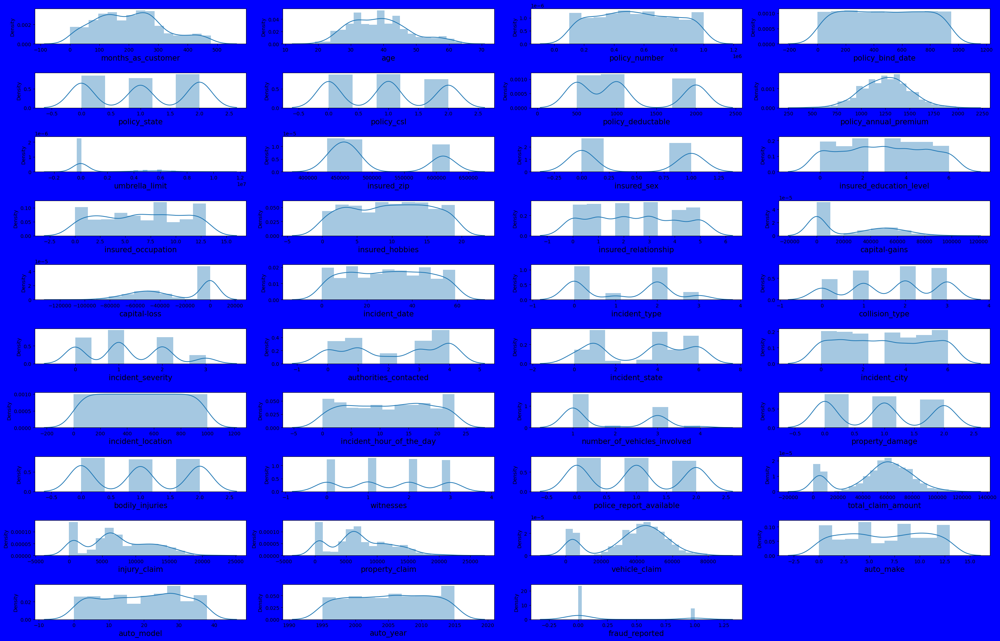

In [81]:
#Check for normal distribution and see how data is distributed for every column
plt.figure(figsize=(28,18), facecolor='blue')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df:#triggering your for loop
    if plotnumber<=40:#since there are 6 features
        ax = plt.subplot(10,4,plotnumber)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.distplot(df[column])#performing a distribution plot for all the columns starting with fixed acidity
        plt.xlabel(column,fontsize=15)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

# Observations on Normal Distribution Check
From the above density plot we can see that the features made up of continous data obeys normal distribution, the building blocks is in tandem with a normalized curve:

- The ploicy number will be dropped because it is not important and contributes nothing to the target


# Step 3.2 - Scatter Plot Check
- Lets visualize the relationship between the features and the Label

In [82]:
#extracting only the features(wihtout the Label) from the original dataset and store in features
features=df.drop('fraud_reported',axis=1)
features

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,328,48,521585,532.0,2.0,1.0,1000,1406.91,0,466132,...,1,2,2.0,71610,6510,13020,52080,10.0,1.0,2004
1,228,42,342868,821.0,1.0,1.0,2000,1197.22,5000000,468176,...,0,0,0.0,5070,780,780,3510,8.0,12.0,2007
2,134,29,687698,186.0,2.0,0.0,2000,1413.14,5000000,430632,...,2,3,1.0,34650,7700,3850,23100,4.0,30.0,2007
3,256,41,227811,766.0,0.0,1.0,2000,1415.74,6000000,608117,...,1,2,1.0,63400,6340,6340,50720,3.0,34.0,2014
4,228,44,367455,181.0,0.0,2.0,1000,1583.91,6000000,610706,...,0,1,1.0,6500,1300,650,4550,0.0,31.0,2009
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,487.0,2.0,2.0,1000,1310.80,0,431289,...,0,1,0.0,87200,17440,8720,61040,6.0,6.0,2006
996,285,41,186934,129.0,0.0,0.0,1000,1436.79,0,608177,...,2,3,0.0,108480,18080,18080,72320,13.0,28.0,2015
997,130,34,918516,509.0,2.0,1.0,500,1383.49,3000000,442797,...,2,3,2.0,67500,7500,7500,52500,11.0,19.0,1996
998,458,62,533940,573.0,0.0,2.0,2000,1356.92,5000000,441714,...,0,1,2.0,46980,5220,5220,36540,1.0,5.0,1998


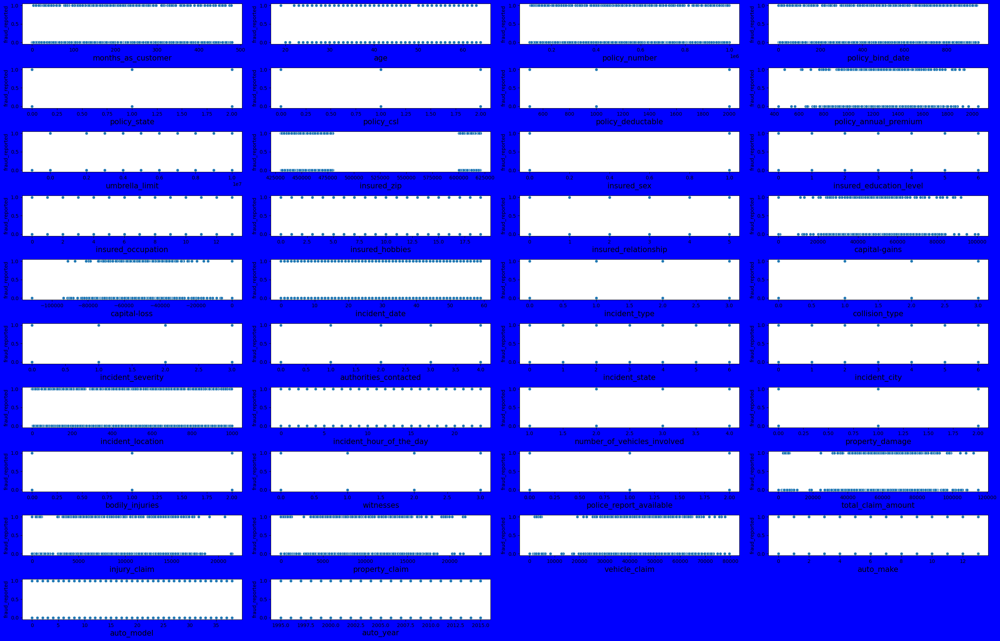

In [83]:
#Check for the relatinship between each features and Target
plt.figure(figsize=(28,18), facecolor='blue')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in features:#triggering your for loop
    if plotnumber<=40:#since there are 6 features
        ax = plt.subplot(10,4,plotnumber)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.scatterplot(x=features[column],y=df['fraud_reported'])#performing a relationship plot between features and label
        plt.xlabel(column,fontsize=15)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

# Observations on Scatter Plot
From the above scatter plot we can see a strong relationship between the below features and the Label(fraud reported)

The other features are categorical features

# Step 3.3 - Correlation Check;
 - Collinearity Between Feature and Label
 - Multicolinearity between features

Lets see/visualize the correlation between (Features vs Label) and (Features vs Features)

In [84]:
#checking for general correlation
df.corr()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922098,0.057555,0.055055,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.017895,...,0.058383,0.017647,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544
age,0.922098,1.000000,0.059413,0.056538,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.025604,...,0.052359,0.014661,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143
policy_number,0.057555,0.059413,1.000000,0.045713,0.072815,0.038917,-0.006738,0.022566,0.008968,0.007083,...,-0.012661,0.032019,-0.018009,-0.008762,-0.010678,-0.020184,0.023860,0.065240,-0.000183,-0.029443
policy_bind_date,0.055055,0.056538,0.045713,1.000000,0.015289,0.008486,-0.001721,-0.037733,-0.024866,-0.042749,...,-0.007004,-0.034920,0.015901,0.024160,0.008611,0.013784,-0.025955,0.000306,0.035067,0.060642
policy_state,-0.000328,-0.014533,0.072815,0.015289,1.000000,0.001027,0.010033,0.012455,-0.029580,0.008777,...,0.022960,0.071950,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432
policy_csl,-0.026819,-0.015185,0.038917,0.008486,0.001027,1.000000,0.003384,0.023978,0.021636,0.006879,...,0.071500,0.002424,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190
policy_deductable,0.026807,0.029188,-0.006738,-0.001721,0.010033,0.003384,1.000000,-0.003245,0.010870,0.004545,...,0.066639,0.030166,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817
policy_annual_premium,0.005018,0.014404,0.022566,-0.037733,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.032354,...,0.002332,0.013624,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480
umbrella_limit,0.015498,0.018126,0.008968,-0.024866,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.019671,...,-0.006738,-0.055951,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622
insured_zip,0.017895,0.025604,0.007083,-0.042749,0.008777,0.006879,0.004545,0.032354,0.019671,1.000000,...,0.019805,-0.017607,-0.033873,-0.017495,-0.006841,-0.041083,-0.020892,0.023637,-0.032736,0.019368


In [85]:
#checking for correlation between each feature and Label
df.corr()['fraud_reported'].sort_values()

incident_severity             -0.405988
incident_state                -0.051407
incident_type                 -0.050376
incident_date                 -0.047726
insured_hobbies               -0.046838
authorities_contacted         -0.045802
incident_city                 -0.040403
policy_csl                    -0.037190
property_damage               -0.030497
policy_number                 -0.029443
police_report_available       -0.028159
auto_make                     -0.027519
capital-gains                 -0.019173
capital-loss                  -0.014863
policy_annual_premium         -0.014480
incident_location             -0.008832
auto_model                     0.000720
insured_occupation             0.001564
incident_hour_of_the_day       0.004316
auto_year                      0.007928
insured_education_level        0.008808
age                            0.012143
policy_deductable              0.014817
insured_zip                    0.019368
months_as_customer             0.020544


<AxesSubplot:>

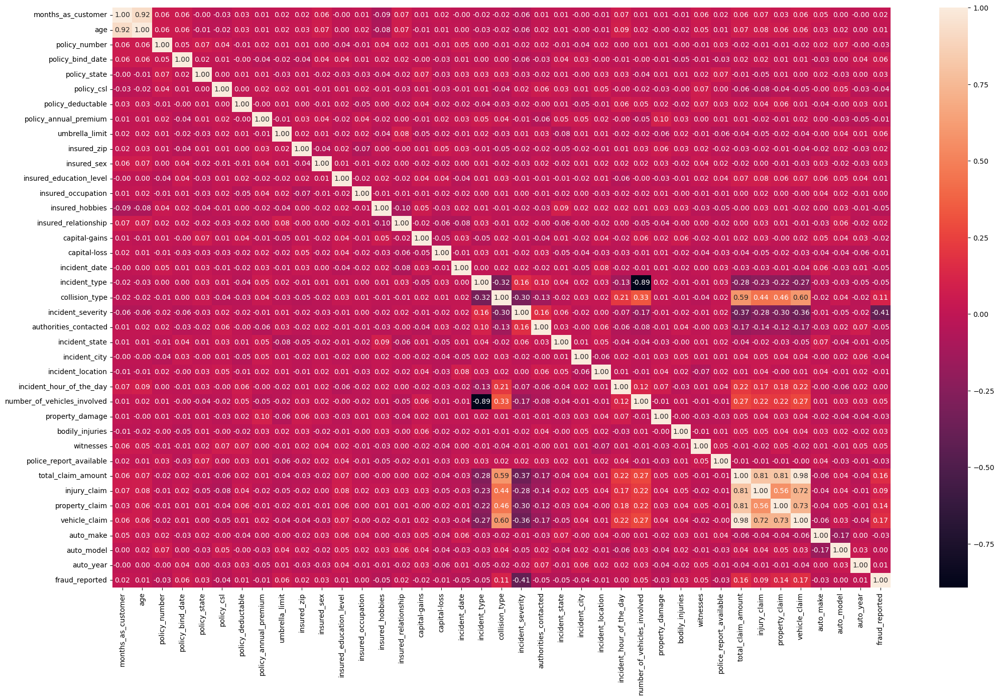

In [86]:
#Plotting a heatmap to show correlation through the brightness of the map-squares
plt.figure(figsize=(25,15))
sns.heatmap(df.corr(),annot=True, linewidth=0,linecolor='black',fmt='.2f')

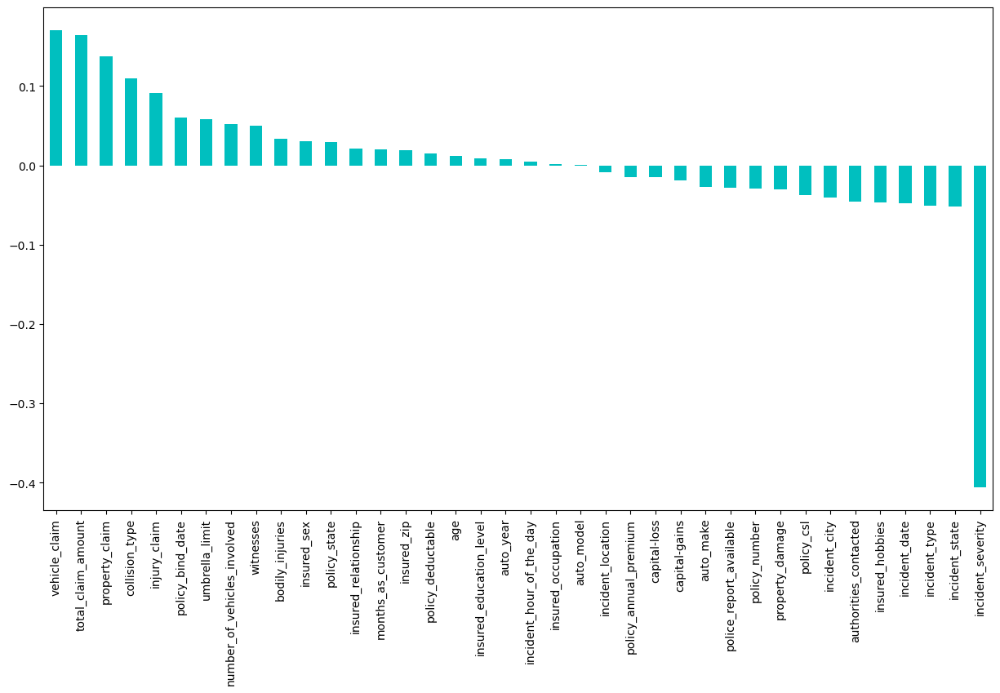

In [87]:
#Plotting a bar chart to visualize correlation through the stand-alone bars
plt.figure(figsize=(15,8))
df.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar', color='c')
plt.show()

# Observations on Correlation
From the above correlation statistics;

Collinearity:
    
-incident_severity             -0.405988:This has a negative correlation of 40% which is a good bond
incident_state                -0.051407:This has a negative correlation of 5% which is a poor bond
incident_state                -0.051407:This has a negative correlation of 5% which is a poor bond
incident_state                -0.051407:This has a negative correlation of 5% which is a poor bond
incident_type                 -0.050376:This has a negative correlation of 5% which is a poor bond
incident_date                 -0.047726:This has a negative correlation of 4% which is a poor bond
insured_hobbies               -0.046838:This has a negative correlation of 4% which is a poor bond
authorities_contacted         -0.045802:This has a negative correlation of 4% which is a poor bond
incident_city                 -0.040403:This has a negative correlation of 4% which is a poor bond
policy_csl                    -0.037190:This has a negative correlation of 3% which is a poor bond
property_damage               -0.030497:This has a negative correlation of 3% which is a poor bond
policy_number                 -0.029443:This has a negative correlation of 3% which is a poor bond
police_report_available       -0.028159:This has a negative correlation of 3% which is a poor bond
auto_make                     -0.027519:This has a negative correlation of 3% which is a poor bond
capital-gains                 -0.019173:This has a negative correlation of 2% which is a poor bond
capital-loss                  -0.014863:This has a negative correlation of 1% which is a poor bond
policy_annual_premium         -0.014480:This has a negative correlation of 1% which is a poor bond
incident_location             -0.008832:This has a negative correlation of 0.8% which is a poor bond
auto_model                     0.000720:This has a positive correlation of 0.07% which is a poor bond
insured_occupation             0.001564:This has a positive correlation of 0.015% which is a poor bond
incident_hour_of_the_day       0.004316:This has a positive correlation of 0.04% which is a poor bond
auto_year                      0.007928:This has a positive correlation of 0.07% which is a poor bond
insured_education_level        0.008808:This has a positive correlation of 0.08% which is a poor bond
age                            0.012143:This has a positive correlation of 1% which is a poor bond
policy_deductable              0.014817:This has a positive correlation of 1% which is a poor bond
insured_zip                    0.019368:This has a positive correlation of 2% which is a poor bond
months_as_customer             0.020544:This has a positive correlation of 2% which is a poor bond
insured_relationship           0.021043:This has a positive correlation of 2% which is a poor bond
policy_state                   0.029432:This has a positive correlation of 3% which is a poor bond
insured_sex                    0.030873:This has a positive correlation of 3% which is a poor bond
bodily_injuries                0.033877:This has a positive correlation of 3% which is a poor bond
witnesses                      0.049497:This has a positive correlation of 5% which is a poor bond
number_of_vehicles_involved    0.051839:This has a positive correlation of 5% which is a poor bond
umbrella_limit                 0.058622:This has a positive correlation of 6% which is a poor bond
policy_bind_date               0.060642:This has a positive correlation of 6% which is a poor bond
injury_claim                   0.090975:This has a positive correlation of 9% which is a poor bond
collision_type                 0.110130:This has a positive correlation of 11% which is weak bond
property_claim                 0.137835:This has a positive correlation of 13% which is weak bond
total_claim_amount             0.163651:This has a positive correlation of 16% which is aweak bond
vehicle_claim                  0.170049:This has a positive correlation of 17% which is aweak bond
incident_type                 -0.050376:This has a negative correlation of 5% which is a poor bond
incident_date                 -0.047726:This has a negative correlation of 5% which is a poor bond
insured_hobbies               -0.046838:This has a negative correlation of 5% which is a poor bond
authorities_contacted         -0.045802:This has a negative correlation of 4% which is a poor bond
incident_city                 -0.040403:This has a negative correlation of 4% which is a poor bond
policy_csl                    -0.037190:This has a negative correlation of 3% which is a poor bond
property_damage               -0.030497:This has a negative correlation of 3% which is a poor bond
policy_number                 -0.029443:This has a negative correlation of 3% which is a poor bond
police_report_available       -0.028159:This has a negative correlation of 3% which is a poor bond
auto_make                     -0.027519:This has a negative correlation of 3% which is a poor bond
capital-gains                 -0.019173:This has a negative correlation of 2% which is a poor bond
capital-loss                  -0.014863:This has a negative correlation of 1.4% which is a poor bond
policy_annual_premium         -0.014480:This has a negative correlation of 1.4% which is a poor bond
incident_location             -0.008832:This has a negative correlation of 0.8% which is apoor bond
auto_model                     0.000720:This has a positive correlation of 0.07% which is afair bond
insured_occupation             0.001564:This has a positive correlation of 0.1% which is afair bond
incident_hour_of_the_day       0.004316:This has a positive correlation of 0.4% which is afair bond
auto_year                      0.007928:This has a positive correlation of 0.7% which is afair bond
insured_education_level        0.008808:This has a positive correlation of 0.8% which is afair bond
age                            0.012143:This has a positive correlation of 1.2% which is afair bond
policy_deductable              0.014817:This has a positive correlation of 1.4% which is afair bond
insured_zip                    0.019368:This has a positive correlation of 2% which is afair bond
months_as_customer             0.020544:This has a positive correlation of 2% which is afair bond
insured_relationship           0.021043:This has a positive correlation of 2% which is afair bond
policy_state                   0.029432:This has a positive correlation of 3% which is afair bond
insured_sex                    0.030873:This has a positive correlation of 3.1% which is afair bond
bodily_injuries                0.033877:This has a positive correlation of 3.4% which is afair bond
witnesses                      0.049497:This has a positive correlation of 3% which is afair bond
number_of_vehicles_involved    0.051839:This has a positive correlation of 4% which is afair bond
umbrella_limit                 0.058622:This has a positive correlation of 5% which is afair bond
policy_bind_date               0.060642:This has a positive correlation of 6% which is afair bond
injury_claim                   0.090975:This has a positive correlation of 9% which is afair bond
collision_type                 0.110130:This has a positive correlation of 11% which is afair bond
property_claim                 0.137835:This has a positive correlation of 16% which is afair bond
total_claim_amount             0.163651:This has a positive correlation of 16% which is afair bond
vehicle_claim                  0.170049:This has a positive correlation of 17% which is a fair bond
 - Feature with Maximum correlation = auto_model 
 - Feature with Minimum correlation = vehicle_claim
 
Multicollinearity:
 - From the heatmap we can see that the pairs of features have some noticeable correllation between them 
  - But we will reconfrim during further steps by finding the Variance Inflation Factor(VIF)


NB: Multicollinnearity means two variables are explaining the same thing, meaning one of them is useless and therefore we have to drop one of them!

From the above there are many features and this can lead to the poor performance of our model.There are techniques we need to employ to featureengineer the features and reduce its dimension by choosing the best features

# Step 3.4 - Outlier Check

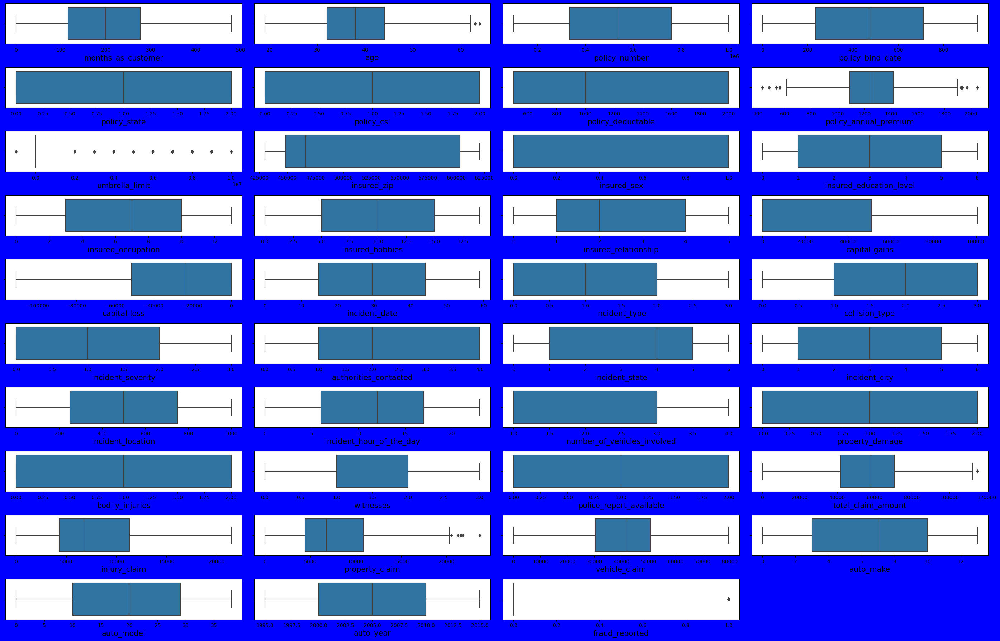

In [88]:
#Check for normal distribution and see how data is distributed for every column
plt.figure(figsize=(28,18), facecolor='blue')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df:#triggering your for loop
    if plotnumber<=40:#since there are 6 features
        ax = plt.subplot(10,4,plotnumber)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.boxplot(df[column])#performing a distribution plot for all the columns starting with fixed acidity
        plt.xlabel(column,fontsize=15)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

# Observations on Outlier Check
From the above visualization plot its evident that there are no outliers, however this is subject to further analysis and reconfirmation using the zscore!

# Step 3.5 - Skewness Check

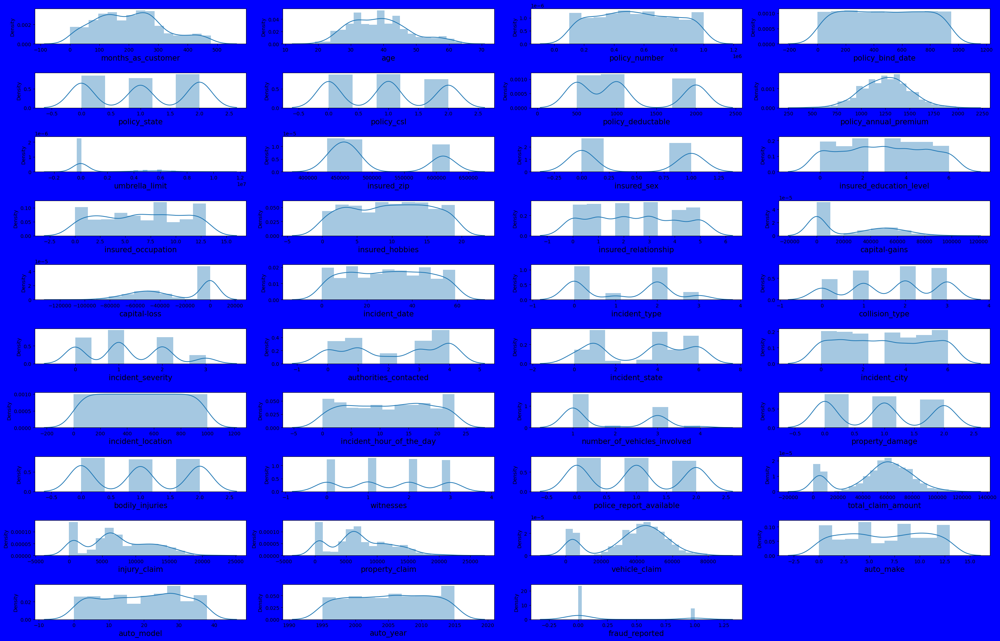

In [89]:
#Check for normal distribution and see how data is distributed for every column
plt.figure(figsize=(28,18), facecolor='blue')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df:#triggering your for loop
    if plotnumber<=40:#since there are 6 features
        ax = plt.subplot(10,4,plotnumber)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.distplot(df[column])#performing a distribution plot for all the columns starting with fixed acidity
        plt.xlabel(column,fontsize=15)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

In [90]:
#Checking for skewness in each independent variable data which has been stored in the dataframe; 'features'
features.skew()

months_as_customer             0.362177
age                            0.478988
policy_number                  0.038991
policy_bind_date               0.005194
policy_state                  -0.026177
policy_csl                     0.088928
policy_deductable              0.477887
policy_annual_premium          0.004402
umbrella_limit                 1.806712
insured_zip                    0.816554
insured_sex                    0.148630
insured_education_level       -0.000148
insured_occupation            -0.058881
insured_hobbies               -0.061563
insured_relationship           0.077488
capital-gains                  0.478850
capital-loss                  -0.391472
incident_date                  0.004756
incident_type                  0.101507
collision_type                -0.193345
incident_severity              0.279016
authorities_contacted         -0.121744
incident_state                -0.148865
incident_city                  0.049531
incident_location              0.000000


# Observations on Skewness Check: 
Lets assume Skewness threshold is taken as +/-0.65.Meaning any value outside +/-0.65 contains skewness. Hence the Columns below are having skewness:

From the values above the continous data is noy skewed

# Step 3.6  - Target Variable Check

0.0    753
1.0    247
Name: fraud_reported, dtype: int64


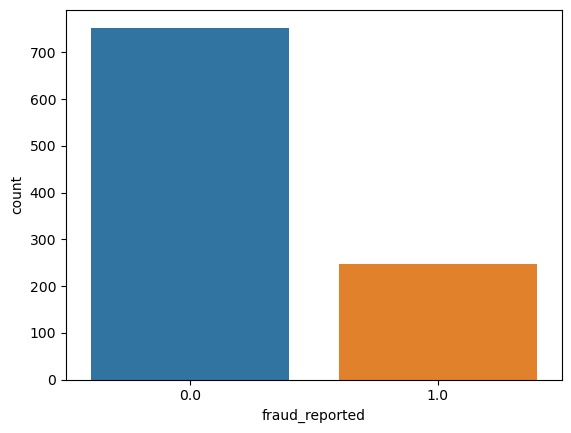

In [91]:
ax=sns.countplot(x='fraud_reported',data=df)
print(df['fraud_reported'].value_counts())

from the above graph the we can see that the data is imbalanced and it has two classes 

# Step 4 - DATA PREPROCESSING

# Step 4.1 - Removal of Duplicates

In [92]:
#Recheking shape of original data
df.shape

(1000, 39)

In [93]:
#Remove duplicates
df.drop_duplicates(inplace=True)
df.shape

(1000, 39)

In [94]:
# it appears that there are not duplicates

From the above graph we can see:
 - the dependent variable has now two classes of quality with the majority being Class 0 and minority Class 1
 - there is a clear case of imbalanced data and this will be resolved during futher preprocessing using sampling techniques

# Step 4.3 - Rechecking the current Relationship btw Variables
# Bivariate Analysis

In [95]:
#seperating the variables into X and Y variables
X=df.drop(columns=['fraud_reported'])
Y=df['fraud_reported']

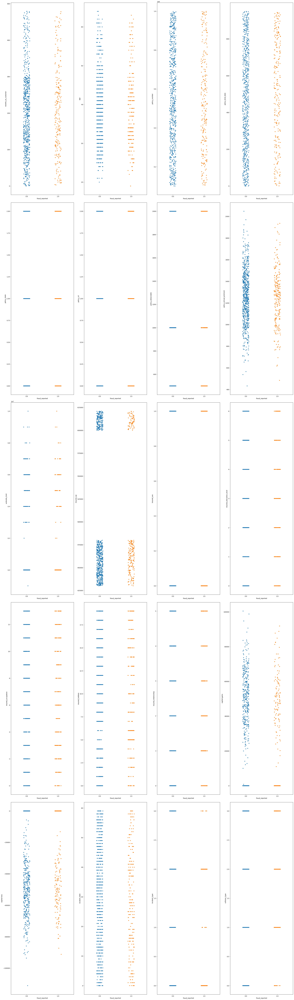

In [96]:
#Lets visualize our current data using a stripplot
plt.figure(figsize=(28,189))#dimension only
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’
for column in X:#triggering your for loop
    if plotnumber<=20:#since there are 9 features
        ax = plt.subplot(10,4,plotnumber)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.stripplot(Y,X[column])#performing a strip plot
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#

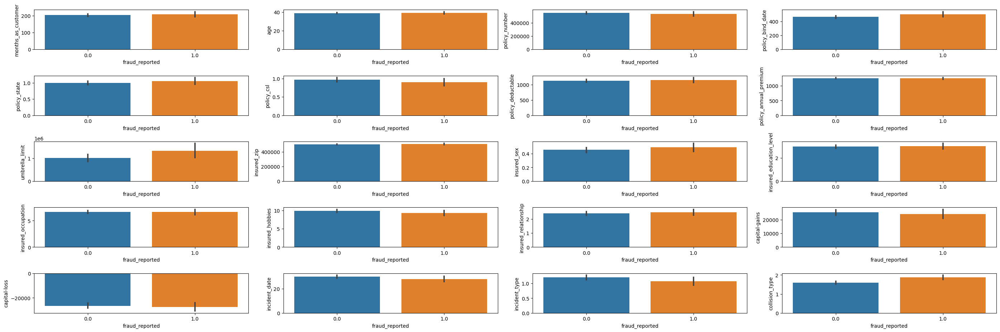

In [97]:
#Lets visualize our current data using a stripplot
plt.figure(figsize=(28,18))#dimension only
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’
for column in X:#triggering your for loop
    if plotnumber<=20:#since there are 9 features
        ax = plt.subplot(10,4,plotnumber)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.barplot(Y,X[column])#performing a strip plot
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#

From the above strip plot and bar plots , you can see that these plots reveals the bivariate relationship between the features and the target(churn);



# Step 4.4 - Dropping of Features that strongly promotes multicollinearity(VIF)

<AxesSubplot:>

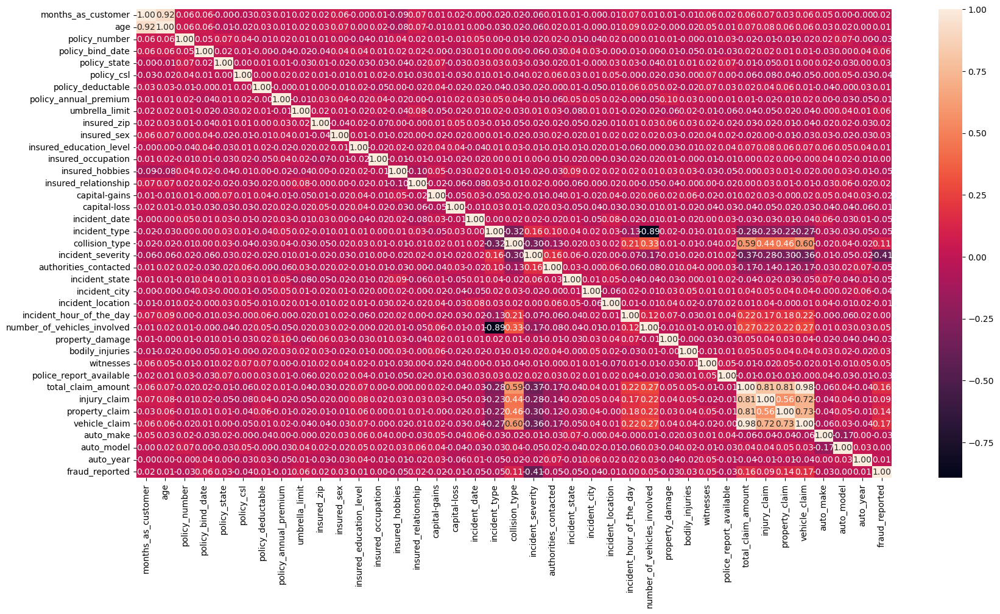

In [98]:
#Lets have a view of the heatmap again with particular focus on map-squares that are more brightened
plt.figure(figsize=(20,10))
sns.heatmap(df.corr(),annot=True, linewidth=0,linecolor='black',fmt='.2f')

From the heatmap we can see that the pairs of features have some noticeable correllation between them;
 - Contract vs tenure has a correlation of 67%


However, lets reconfirm by calculating the Variance Inflation Factor(VIF)!

# Variance Inflation Factor(VIF)

To solve this multicollinearity problem, we have to first scale our data using Standard Scaler

In [99]:
scalar=StandardScaler()
X_Scaled = scalar.fit_transform(X)
X_Scaled

array([[ 1.07813958,  0.99083647, -0.09595307, ...,  0.85646614,
        -1.64574255, -0.1834404 ],
       [ 0.2089946 ,  0.33407345, -0.79152739, ...,  0.36053902,
        -0.65747047,  0.31549088],
       [-0.60800168, -1.08891308,  0.55056594, ..., -0.63131523,
         0.95970204,  0.31549088],
       ...,
       [-0.64276748, -0.54161057,  1.44891961, ...,  1.1044297 ,
        -0.02857005, -1.5139238 ],
       [ 2.20802805,  2.52328351, -0.04786687, ..., -1.37520591,
        -1.28637088, -1.18130295],
       [ 2.19064515,  2.3043625 ,  0.03830297, ...,  0.36053902,
        -0.65747047,  0.31549088]])

In [100]:
#checking the shape
X_Scaled.shape

(1000, 38)

Now we shall treat the above shape as an array of numbers(tuple) where 1359 and 11 are the zeroth and first index respectively.

In [101]:
#initializing...creating an empty dataframe stored in vif
vif=pd.DataFrame()

In [102]:
vif['vif']=[variance_inflation_factor(X_Scaled, i) for i in range(X_Scaled.shape[1])]#This is a list comprehension. in the for loop, the range(X_Scaled.shape[1]) which also means range(11) or (0,1,2,3,4,5,6,7,8,9,10), since X_Scaled.shape[1] means the first index in the X_Scaled.shape which is 11. Now all the columns in X_Scaled which is (0,1,2,3,4,5,6,7,8,9,10,) will now be compared with the entire X_Scaled one by one using the other part of the syntax which is variance_inflation_factor(X_Scaled, i). To shed more light, what happens here is that during th comparison using variance_inflation_factor(X_Scaled, i), the i is seen as a ‘Label’ while the X_Scaled is seen as a Feature. The output of this list comprehension is then stored in a column named 'vif' inside the empty ‘vif dataframe’ created above

In [103]:
vif['Features'] = X.columns#creating another column named 'Features' inside the empty vif Dataframe created earlier and populating it with a data called X.columns(i.e column names from the X DataFrame which was created by dropping the Label – ‘quality’ )
vif

,vif,Features
0,6.838211,months_as_customer
1,6.855296,age
2,1.031858,policy_number
3,1.028526,policy_bind_date
4,1.038523,policy_state
5,1.031794,policy_csl
6,1.037514,policy_deductable
7,1.041779,policy_annual_premium
8,1.030735,umbrella_limit
9,1.034386,insured_zip


From the above vif dataframe,we are setting a vif threshold of 5, meaning any feature with Variance Inflation Factor greater than 5 is assumed to have a multicollinearity problem. it is not standard. The dataset demands.

In lieu of the above assumption, there is no vif figure higher than 5

In [104]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,532.0,2.0,1.0,1000,1406.91,0,466132,...,2,2.0,71610,6510,13020,52080,10.0,1.0,2004,1.0
1,228,42,342868,821.0,1.0,1.0,2000,1197.22,5000000,468176,...,0,0.0,5070,780,780,3510,8.0,12.0,2007,1.0
2,134,29,687698,186.0,2.0,0.0,2000,1413.14,5000000,430632,...,3,1.0,34650,7700,3850,23100,4.0,30.0,2007,0.0
3,256,41,227811,766.0,0.0,1.0,2000,1415.74,6000000,608117,...,2,1.0,63400,6340,6340,50720,3.0,34.0,2014,1.0
4,228,44,367455,181.0,0.0,2.0,1000,1583.91,6000000,610706,...,1,1.0,6500,1300,650,4550,0.0,31.0,2009,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,487.0,2.0,2.0,1000,1310.80,0,431289,...,1,0.0,87200,17440,8720,61040,6.0,6.0,2006,0.0
996,285,41,186934,129.0,0.0,0.0,1000,1436.79,0,608177,...,3,0.0,108480,18080,18080,72320,13.0,28.0,2015,0.0
997,130,34,918516,509.0,2.0,1.0,500,1383.49,3000000,442797,...,3,2.0,67500,7500,7500,52500,11.0,19.0,1996,0.0
998,458,62,533940,573.0,0.0,2.0,2000,1356.92,5000000,441714,...,1,2.0,46980,5220,5220,36540,1.0,5.0,1998,0.0


# Step 4.5 - Removal of Outliers

This will be achieved using the zscore

In [105]:
#Get the absolute value of the zscore of the remaining dataset
np.abs(zscore(df))

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,1.078140,0.990836,0.095953,0.209500,1.187173,0.060937,0.222383,0.616705,0.479476,0.489529,...,0.461838,1.270313,0.714257,0.189283,1.165505,0.749653,0.856466,1.645743,0.183440,1.746019
1,0.208995,0.334073,0.791527,1.259397,0.016856,0.060937,1.412784,0.242521,1.697980,0.461008,...,1.338700,1.198712,1.807312,1.363822,1.372696,1.823346,0.360539,0.657470,0.315491,1.746019
2,0.608002,1.088913,0.550566,1.047470,1.187173,1.182668,1.412784,0.642233,1.697980,0.984885,...,1.362107,0.035801,0.686362,0.054644,0.736072,0.785565,0.631315,0.959702,0.315491,0.572731
3,0.452355,0.224613,1.239334,1.059589,1.220886,0.060937,1.412784,0.652886,2.133471,1.491682,...,0.461838,0.035801,0.403135,0.224130,0.219722,0.677607,0.879279,1.319074,1.479664,1.746019
4,0.208995,0.552994,0.695834,1.065634,1.220886,1.304542,0.222383,1.341980,2.133471,1.527808,...,0.438431,0.035801,1.753121,1.257232,1.399654,1.768252,1.623169,1.049545,0.648112,0.572731
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,1.746582,0.103769,1.539740,0.046021,1.187173,1.304542,0.222383,0.222884,0.479476,0.975717,...,0.438431,1.198712,1.305049,2.051155,0.273817,1.224309,0.135388,1.196528,0.149180,0.572731
996,0.704407,0.224613,1.398429,1.254543,1.220886,1.182668,0.222383,0.739141,0.479476,1.492519,...,1.362107,1.198712,2.111466,2.182342,2.214794,1.821868,1.600357,0.780016,1.645974,0.572731
997,0.642767,0.541611,1.448920,0.125944,1.187173,0.060937,1.039966,0.520739,0.826998,0.815138,...,1.362107,1.270313,0.558507,0.013648,0.020826,0.771902,1.104430,0.028570,1.513924,0.572731
998,2.208028,2.523284,0.047867,0.358447,1.220886,1.304542,1.412784,0.411866,1.697980,0.830250,...,0.438431,1.270313,0.219110,0.453708,0.451976,0.073580,1.375206,1.286371,1.181303,0.572731


In [106]:
#checking the data shape
z=np.abs(zscore(df))
z.shape

(1000, 39)

Now we are setting threshold of outlier zscore>3, meaning any zscore above 3 is assumed to be an Outlier. Again, its not standard. The dataset demands.

In [107]:
#index number
np.where(z>3)

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
        657, 700, 763, 807, 875, 922, 975], dtype=int64),
 array([ 8,  8,  8,  8,  8,  7,  7,  8,  8,  8,  8, 33,  8,  8,  8,  7, 16,
         8,  8,  8], dtype=int64))

In [108]:
#Extracting out the non-outliers(i.e zscore<3) and storing output in new object
df_new=df[(z<3).all(axis=1)]
print("Old DataFrame",df.shape)#Data still with outliers
print("New DataFrame",df.shape)#Data without outliers
print("total_dropped_rows",df.shape[0]-df_new.shape[0])#Take note of this arithmetic in df.shape

Old DataFrame (1000, 39)
New DataFrame (1000, 39)
total_dropped_rows 20


A Total of 682 outliers have been removed! Lets move on!

In [109]:
#Checking the new dataframe with non-outliers
df_new

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,532.0,2.0,1.0,1000,1406.91,0,466132,...,2,2.0,71610,6510,13020,52080,10.0,1.0,2004,1.0
1,228,42,342868,821.0,1.0,1.0,2000,1197.22,5000000,468176,...,0,0.0,5070,780,780,3510,8.0,12.0,2007,1.0
2,134,29,687698,186.0,2.0,0.0,2000,1413.14,5000000,430632,...,3,1.0,34650,7700,3850,23100,4.0,30.0,2007,0.0
3,256,41,227811,766.0,0.0,1.0,2000,1415.74,6000000,608117,...,2,1.0,63400,6340,6340,50720,3.0,34.0,2014,1.0
4,228,44,367455,181.0,0.0,2.0,1000,1583.91,6000000,610706,...,1,1.0,6500,1300,650,4550,0.0,31.0,2009,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,487.0,2.0,2.0,1000,1310.80,0,431289,...,1,0.0,87200,17440,8720,61040,6.0,6.0,2006,0.0
996,285,41,186934,129.0,0.0,0.0,1000,1436.79,0,608177,...,3,0.0,108480,18080,18080,72320,13.0,28.0,2015,0.0
997,130,34,918516,509.0,2.0,1.0,500,1383.49,3000000,442797,...,3,2.0,67500,7500,7500,52500,11.0,19.0,1996,0.0
998,458,62,533940,573.0,0.0,2.0,2000,1356.92,5000000,441714,...,1,2.0,46980,5220,5220,36540,1.0,5.0,1998,0.0


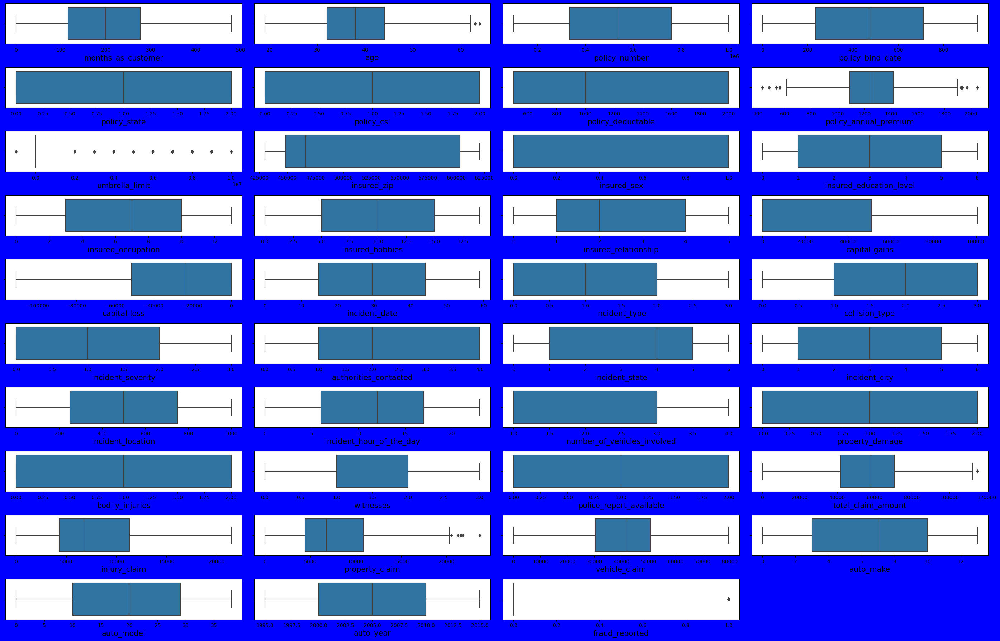

In [110]:
#Check for normal distribution and see how data is distributed for every column
plt.figure(figsize=(28,18), facecolor='blue')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df:#triggering your for loop
    if plotnumber<=40:#since there are 6 features
        ax = plt.subplot(10,4,plotnumber)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.boxplot(df[column])#performing a distribution plot for all the columns starting with fixed acidity
        plt.xlabel(column,fontsize=15)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

From the above we can see that the real outliers have been removed across the features!

# Step 4.6 - Transforming Data to Remove Skewness using Power transformation

In [111]:
#rechecking for skewness...
df_new.skew()

months_as_customer             0.362608
age                            0.475385
policy_number                  0.036283
policy_bind_date               0.006386
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_zip                    0.837283
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369


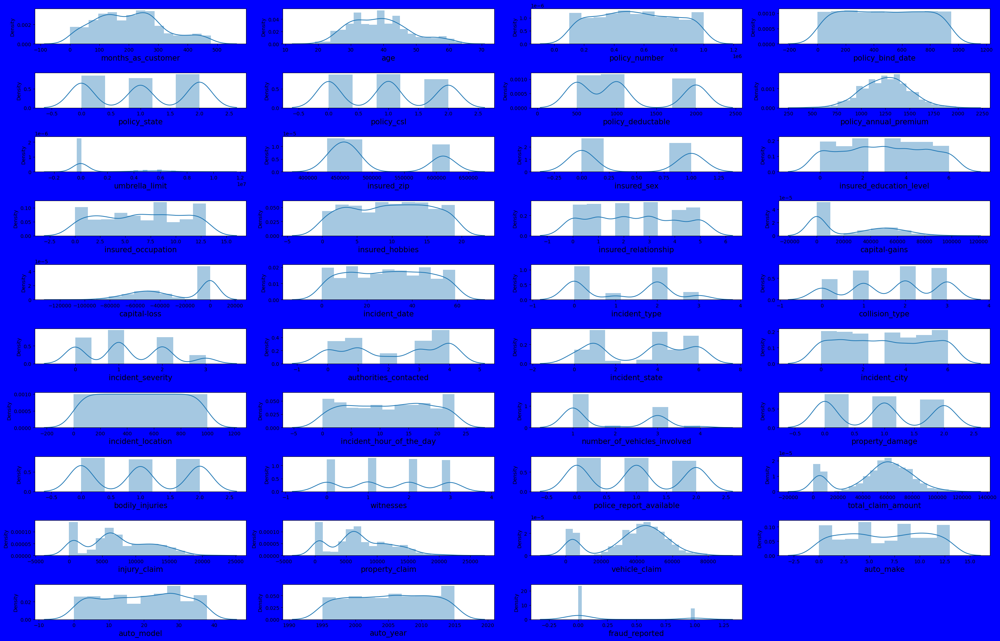

In [112]:
#Check for normal distribution and see how data is distributed for every column
plt.figure(figsize=(28,18), facecolor='blue')#dimension and line color
plotnumber = 1 #like a form of counter which we will see its relevance in the ‘for loop’

for column in df:#triggering your for loop
    if plotnumber<=40:#since there are 6 features
        ax = plt.subplot(10,4,plotnumber)#3,4 means arrange the graphs in 3-rows and 4-columns spaces as seen below while plotnumber means plot graphs
        sns.distplot(df[column])#performing a distribution plot for all the columns starting with fixed acidity
        plt.xlabel(column,fontsize=15)#labelling the x-axis with their respctive column names with a font size of 20
    plotnumber+=1#incrementals for plot number so as to allow ploting one by one until it gets to 12
plt.tight_layout()#This is just to show you data in a compact form. 

There is no need to apply anyform of transformation because the data is not skewed

In [113]:
from featurewiz import featurewiz

In [114]:
#Instantiating PowerTransformer,using 'yeo-johnson',into object 'scaler'
# scaler = PowerTransformer(method ='yeo-johnson')#intstantiating using the yeo-johnson
'''
parameters:
method = 'box-cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box-cox' or 'yeo-johnson'\n"

In [115]:
df_new.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

From the above we can see that skewness has been removed!

# check for stronger correlation between features and target

In [116]:
df_new.corr()['fraud_reported'].sort_values()

incident_severity             -0.401808
incident_date                 -0.061271
incident_state                -0.052027
insured_hobbies               -0.048181
authorities_contacted         -0.043636
incident_type                 -0.040893
incident_city                 -0.039434
policy_number                 -0.036887
policy_csl                    -0.032509
auto_make                     -0.032206
property_damage               -0.028548
police_report_available       -0.023824
capital-loss                  -0.017617
capital-gains                 -0.014993
policy_annual_premium         -0.012686
incident_location             -0.007499
auto_model                    -0.002825
insured_occupation             0.000277
auto_year                      0.001152
incident_hour_of_the_day       0.004326
insured_zip                    0.009699
insured_education_level        0.013116
age                            0.013279
policy_deductable              0.015774
insured_sex                    0.020582


# Feature selection and engineering

# lets import a package to select the best features

# automatic feature selection by using featurewiz package

############################################################################################
############       F A S T   F E A T U R E  E N G G    A N D    S E L E C T I O N ! ########
# Be judicious with featurewiz. Don't use it to create too many un-interpretable features! #
############################################################################################
Correlation Limit = 0.7
Skipping feature engineering since no feature_engg input...
Skipping category encoding since no category encoders specified in input...
#### Single_Label Binary_Classification problem ####
    Loaded train data. Shape = (980, 39)
    Some column names had special characters which were removed...
#### Single_Label Binary_Classification problem ####
No test data filename given...
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
###############################################

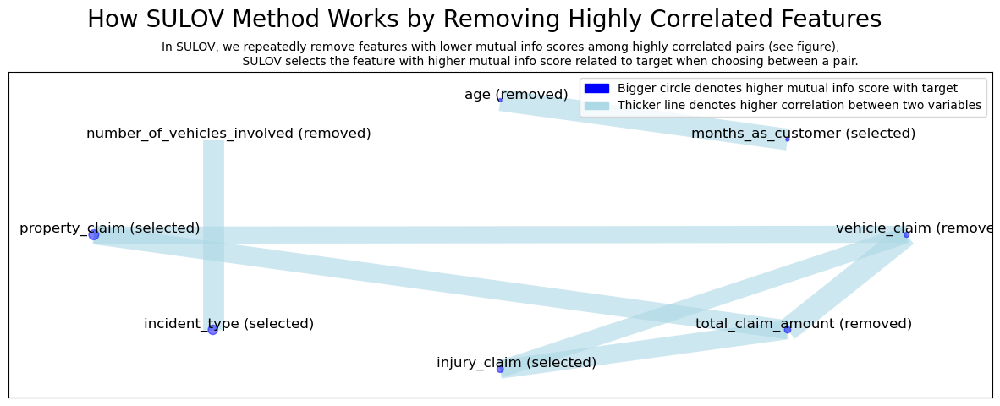

Time taken for SULOV method = 6 seconds
    Adding 0 categorical variables to reduced numeric variables  of 32
Finally 32 vars selected after SULOV
Converting all features to numeric before sending to XGBoost...
#######################################################################################
#####    R E C U R S I V E   X G B O O S T : F E A T U R E   S E L E C T I O N  #######
#######################################################################################
    using regular XGBoost
Current number of predictors before recursive XGBoost = 32 
    Taking top 9 features per iteration...
    XGBoost version using 1.6.2 as tree method: hist
Number of booster rounds = 100
        using 32 variables...
            selecting 3 features in this iteration
            Time taken for regular XGBoost feature selection = 0 seconds
        using 26 variables...
            selecting 4 features in this iteration
            Time taken for regular XGBoost feature selection = 0 seconds
   

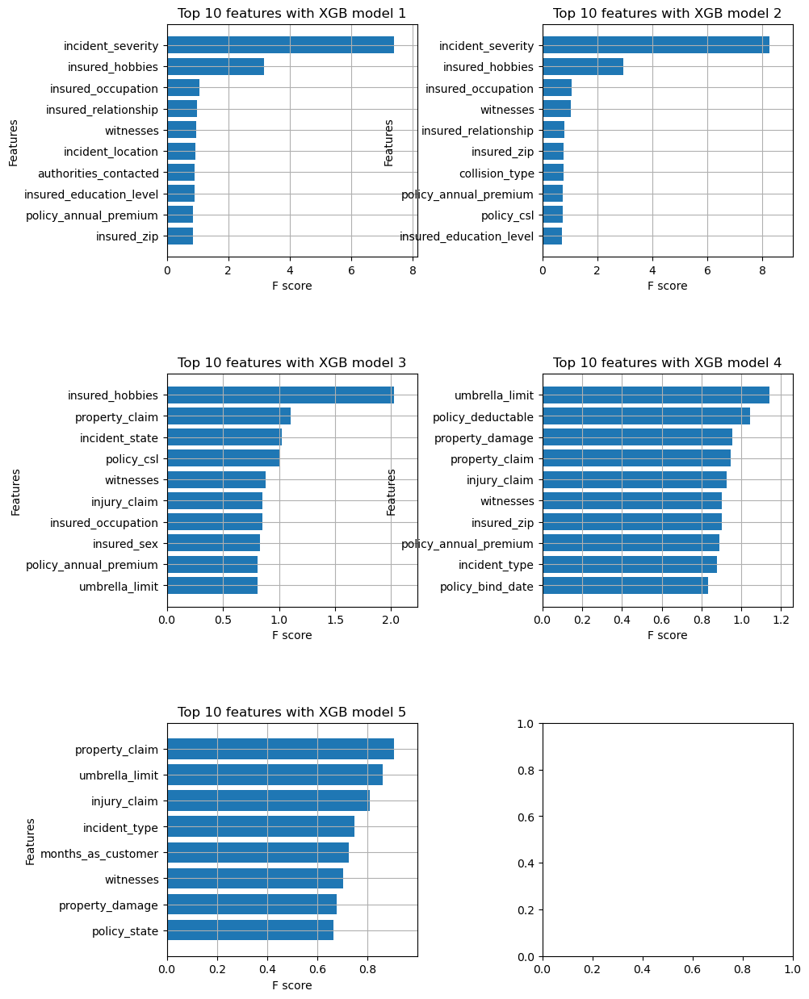

    Completed XGBoost feature selection in 1 seconds
    Alert: No ID variables ['policy_number'] are included in selected features
#######################################################################################
#####          F E A T U R E   S E L E C T I O N   C O M P L E T E D            #######
#######################################################################################
Selected 9 important features:
['incident_severity', 'insured_hobbies', 'insured_occupation', 'witnesses', 'property_claim', 'incident_state', 'policy_csl', 'umbrella_limit', 'policy_deductable']
Total Time taken for featurewiz selection = 9 seconds
Output contains a list of 9 important features and a train dataframe


In [117]:
target = 'fraud_reported'
 
features, train = featurewiz(df_new, target, corr_limit=0.7, verbose=2, sep=",",
header=0,test_data="", feature_engg="", category_encoders="")

In [118]:
# As you can see, Featurewiz selects 9 important features from the dataset. The Featurewiz instance returns two objects 

# Features - a list of selected features
# One dataframe - This dataframe contains only selected features and the target variable.
# Now you can train the models with selected features.

# Let see the list of selected features.

print(features)

['incident_severity', 'insured_hobbies', 'insured_occupation', 'witnesses', 'property_claim', 'incident_state', 'policy_csl', 'umbrella_limit', 'policy_deductable']


In [119]:
df_new[features]

,incident_severity,insured_hobbies,insured_occupation,witnesses,property_claim,incident_state,policy_csl,umbrella_limit,policy_deductable
0,0.0,17.0,2.0,2,13020,4.0,1.0,0,1000
1,1.0,15.0,6.0,0,780,5.0,1.0,5000000,2000
2,1.0,2.0,11.0,3,3850,1.0,0.0,5000000,2000
3,0.0,2.0,1.0,2,6340,2.0,1.0,6000000,2000
4,1.0,2.0,11.0,1,650,1.0,2.0,6000000,1000
...,...,...,...,...,...,...,...,...,...
995,1.0,13.0,2.0,1,8720,0.0,2.0,0,1000
996,0.0,17.0,9.0,3,18080,4.0,0.0,0,1000
997,1.0,3.0,1.0,3,7500,0.0,1.0,3000000,500
998,0.0,0.0,5.0,1,5220,1.0,2.0,5000000,2000


# Step 4.7 - Seperating the datasets into X and Y variables

In [120]:
#seperation
X=df_new[features]
Y=df_new['fraud_reported']

# Transforming data into standard normal distribution

In [121]:
#transforming dataset into a standard normal distribution
scalar=StandardScaler()
X_Scaled = scalar.fit_transform(X)
X_Scaled

array([[-1.25994697,  1.27527868, -1.15608722, ...,  0.06723144,
        -0.46787818, -0.22464306],
       [-0.19550901,  0.9237745 , -0.16029247, ...,  0.06723144,
         1.89076697,  1.41216137],
       [-0.19550901, -1.36100266,  1.08445096, ..., -1.17591597,
         1.89076697,  1.41216137],
       ...,
       [-0.19550901, -1.18525057, -1.40503591, ...,  0.06723144,
         0.94730891, -1.04304527],
       [-1.25994697, -1.71250684, -0.40924116, ...,  1.31037885,
         1.89076697,  1.41216137],
       [-0.19550901,  0.22076614,  1.08445096, ...,  0.06723144,
        -0.46787818, -0.22464306]])

What standard scaler does is to bring mean to zero and standard deviation to 1

In [122]:
#reconfirming that mean is 0
X_Scaled.mean()

2.9001744316738786e-17

In [123]:
#reconfirming that standard deviation is 1
X_Scaled.std()

1.0

# Imbalancing of Target Variable

0.0    753
1.0    247
Name: fraud_reported, dtype: int64


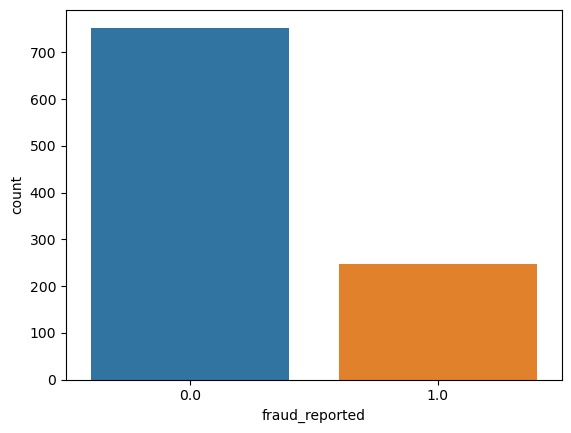

In [124]:
#Lets visualize data distribution amongst the new Binary classes
ax=sns.countplot(x='fraud_reported',data=df)
print(df['fraud_reported'].value_counts())

From the above graph we can see:

- the dependent variable has two classes of quality with the majority being Class 0 and minority Class 1
- there is a clear case of imbalanced data and this will be resolved during futher preprocessing using sampling techniques

# Step 5 - MODEL BUILDING

# Step 5.1 - Logistic Regression

# Best Random State and Balancing Target Data(Oversampling)

In [125]:
#Using LogisticRegression to get the best Random state and apply SMOTE Oversampling technique
lr=LogisticRegression()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    lr.fit(x_train_ns,y_train_ns)
    pred_train=lr.predict(x_train_ns)
    pred_test=lr.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  78.6 and 76.7 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  75.0 and 78.7 respectively
The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  78.1 and 78.3 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  75.5 and 76.1 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At rando

At random state:- 46 Testing Accuracy and Training Accuracy are:-  78.6 and 78.1 respectively
The number of classes before fitCounter({0.0: 596, 1.0: 188})
The number of classes before fitCounter({0.0: 596, 1.0: 447})
At random state:- 47 Testing Accuracy and Training Accuracy are:-  78.1 and 74.3 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 48 Testing Accuracy and Training Accuracy are:-  80.6 and 78.1 respectively
The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes before fitCounter({0.0: 594, 1.0: 445})
At random state:- 49 Testing Accuracy and Training Accuracy are:-  74.5 and 80.9 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 50 Testing Accuracy and Training Accuracy are:-  75.0 and 77.8 respectively
The number of classes before fitCo

The number of classes before fitCounter({0.0: 601, 1.0: 183})
The number of classes before fitCounter({0.0: 601, 1.0: 450})
At random state:- 92 Testing Accuracy and Training Accuracy are:-  81.1 and 77.7 respectively
The number of classes before fitCounter({0.0: 593, 1.0: 191})
The number of classes before fitCounter({0.0: 593, 1.0: 444})
At random state:- 93 Testing Accuracy and Training Accuracy are:-  75.5 and 78.1 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 94 Testing Accuracy and Training Accuracy are:-  78.1 and 77.1 respectively
The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes before fitCounter({0.0: 594, 1.0: 445})
At random state:- 95 Testing Accuracy and Training Accuracy are:-  81.6 and 80.3 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At r

At random state:- 136 Testing Accuracy and Training Accuracy are:-  77.6 and 78.3 respectively
The number of classes before fitCounter({0.0: 593, 1.0: 191})
The number of classes before fitCounter({0.0: 593, 1.0: 444})
At random state:- 137 Testing Accuracy and Training Accuracy are:-  78.6 and 77.8 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 138 Testing Accuracy and Training Accuracy are:-  80.1 and 79.8 respectively
The number of classes before fitCounter({0.0: 597, 1.0: 187})
The number of classes before fitCounter({0.0: 597, 1.0: 447})
At random state:- 139 Testing Accuracy and Training Accuracy are:-  80.1 and 77.4 respectively
The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes before fitCounter({0.0: 594, 1.0: 445})
At random state:- 140 Testing Accuracy and Training Accuracy are:-  79.6 and 77.2 respectively
The number of classes before 

The number of classes before fitCounter({0.0: 588, 1.0: 196})
The number of classes before fitCounter({0.0: 588, 1.0: 441})
At random state:- 182 Testing Accuracy and Training Accuracy are:-  81.1 and 76.1 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 183 Testing Accuracy and Training Accuracy are:-  79.1 and 76.2 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 184 Testing Accuracy and Training Accuracy are:-  84.2 and 75.9 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 185 Testing Accuracy and Training Accuracy are:-  80.1 and 77.7 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})


The best accuracy is 84.20% at random state 184

We have found best_random state value as 184. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [126]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=184,test_size=0.20)

In [127]:
x_train.shape

(784, 9)

In [128]:
x_test.shape

(196, 9)

In [129]:
y_train.shape

(784,)

In [130]:
y_test.shape

(196,)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [131]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes after fitCounter({0.0: 587, 1.0: 440})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 197 to 440.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [132]:
lr=LogisticRegression()
lr.fit(x_train_ns,y_train_ns)
pred_test=lr.predict(x_test)
pred_train=lr.predict(x_train_ns)
Test_Accuracy_lr= (accuracy_score(y_test,pred_test))
Train_Accuracy_lr= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  85.2
Confusion Matrix  [[134  19]
 [ 10  33]]
Classification Report                precision    recall  f1-score   support

         0.0       0.93      0.88      0.90       153
         1.0       0.63      0.77      0.69        43

    accuracy                           0.85       196
   macro avg       0.78      0.82      0.80       196
weighted avg       0.87      0.85      0.86       196



LogisticRegression is producing good accuracy 85.2%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [133]:
#Validation accuracy
vac=cross_val_score(lr,X,Y,cv=5)
CV_Score_lr=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_lr)

[0.75510204 0.75510204 0.75510204 0.75510204 0.75510204]
Cross Validation Score is  0.7551020408163265


# Difference between Accuracy Score and Cross Validation Score

In [134]:
Test_Accuracy_lr

0.8520408163265306

In [135]:
CV_Score_lr

0.7551020408163265

In [136]:
lr_Acc_vs_CV_Score=np.abs(Test_Accuracy_lr-CV_Score_lr)
print("Difference between Accuracy and Cross Validation Score = ",lr_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.09693877551020413


From the above you can see that difference between Accuracy and Cross Validation score is neglible(0.096) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see the Accuracy of other Models!

# Step 5.2 - DecisionTree Classifier

# Best Random State and Balancing Target Data(Oversampling)

In [137]:
#Using Decision tree Classifier to get the best Random state and apply SMOTE Oversampling technique
dt=DecisionTreeClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    dt.fit(x_train_ns,y_train_ns)
    pred_train=dt.predict(x_train_ns)
    pred_test=dt.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  75.5 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  84.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  76.5 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  75.5 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At r

At random state:- 39 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  81.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  77.0 and 100.0 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 42 Testing Accuracy and Training Accuracy are:-  76.5 and 100.0 respectively
The number of classes before fitCounter({0.0: 601, 1.0: 183})
The number of classes before fitCounter({0.0: 601, 1.0: 450})
At random state:- 43 Testing Accuracy and Training Accuracy are:-  78.6 and 100.0 respectively
The number of classes before 

At random state:- 94 Testing Accuracy and Training Accuracy are:-  80.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes before fitCounter({0.0: 594, 1.0: 445})
At random state:- 95 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 96 Testing Accuracy and Training Accuracy are:-  77.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 97 Testing Accuracy and Training Accuracy are:-  74.5 and 100.0 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 98 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively
The number of classes before 

The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 146 Testing Accuracy and Training Accuracy are:-  78.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 593, 1.0: 191})
The number of classes before fitCounter({0.0: 593, 1.0: 444})
At random state:- 147 Testing Accuracy and Training Accuracy are:-  73.5 and 100.0 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})
At random state:- 148 Testing Accuracy and Training Accuracy are:-  81.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 602, 1.0: 182})
The number of classes before fitCounter({0.0: 602, 1.0: 451})
At random state:- 149 Testing Accuracy and Training Accuracy are:-  77.0 and 100.0 respectively
The number of classes before fitCounter({0.0: 593, 1.0: 191})
The number of classes before fitCounter({0.0: 593, 1.0: 44

The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 197 Testing Accuracy and Training Accuracy are:-  73.0 and 100.0 respectively
The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes before fitCounter({0.0: 594, 1.0: 445})
At random state:- 198 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 199 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively


The best accuracy is 84.2% at random state 1

We have found best random state value as 1. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [138]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=1,test_size=0.20)

In [139]:
x_train.shape

(784, 9)

In [140]:
x_test.shape

(196, 9)

In [141]:
y_train.shape

(784,)

In [142]:
y_test.shape

(196,)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points. 

In [143]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes after fitCounter({0.0: 586, 1.0: 439})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 198 to 439.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [144]:
dt=LogisticRegression()
dt.fit(x_train_ns,y_train_ns)
pred_test=dt.predict(x_test)
pred_train=dt.predict(x_train_ns)
Test_Accuracy_dt= (accuracy_score(y_test,pred_test))
Train_Accuracy_dt= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  76.02
Confusion Matrix  [[127  27]
 [ 20  22]]
Classification Report                precision    recall  f1-score   support

         0.0       0.86      0.82      0.84       154
         1.0       0.45      0.52      0.48        42

    accuracy                           0.76       196
   macro avg       0.66      0.67      0.66       196
weighted avg       0.78      0.76      0.77       196



Decision Tree Model is producing good accuracy - 76.02%!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [145]:
#Validation accuracy
vac=cross_val_score(dt,X,Y,cv=5)
CV_Score_dt=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_dt)

[0.75510204 0.75510204 0.75510204 0.75510204 0.75510204]
Cross Validation Score is  0.7551020408163265


# Difference between Accuracy Score and Cross Validation Score

In [146]:
Test_Accuracy_dt

0.7602040816326531

In [147]:
CV_Score_dt

0.7551020408163265

In [148]:
dt_Acc_vs_CV_Score=np.abs(Test_Accuracy_dt-CV_Score_dt)
print("Difference between Accuracy and Cross Validation Score = ",dt_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.005102040816326592


From the above you can see that difference between Accuracy and Cross Validation score is low(0.0051) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets try ensembling Techniques!

# Step 5.3 - RandomForest Classifier

# Best Random State and Balancing Data(Oversampling)

In [149]:
#Using RandomForest Classifier to get the best Random state and apply SMOTE Oversampling technique
rf=RandomForestClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    rf.fit(x_train_ns,y_train_ns)
    pred_train=rf.predict(x_train_ns)
    pred_test=rf.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  84.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  83.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  80.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  85.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At r

At random state:- 37 Testing Accuracy and Training Accuracy are:-  86.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes before fitCounter({0.0: 594, 1.0: 445})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  80.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  86.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  83.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  79.1 and 100.0 respectively
The number of classes before 

At random state:- 75 Testing Accuracy and Training Accuracy are:-  83.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  85.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  82.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  82.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 79 Testing Accuracy and Training Accuracy are:-  84.2 and 100.0 respectively
The number of classes before 

At random state:- 113 Testing Accuracy and Training Accuracy are:-  84.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  85.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  83.2 and 99.9 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 116 Testing Accuracy and Training Accuracy are:-  82.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 602, 1.0: 182})
The number of classes before fitCounter({0.0: 602, 1.0: 451})
At random state:- 117 Testing Accuracy and Training Accuracy are:-  83.2 and 100.0 respectively
The number of classes bef

At random state:- 151 Testing Accuracy and Training Accuracy are:-  82.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  83.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 153 Testing Accuracy and Training Accuracy are:-  84.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 154 Testing Accuracy and Training Accuracy are:-  87.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 155 Testing Accuracy and Training Accuracy are:-  84.2 and 100.0 respectively
The number of classes be

At random state:- 189 Testing Accuracy and Training Accuracy are:-  86.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 190 Testing Accuracy and Training Accuracy are:-  84.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 191 Testing Accuracy and Training Accuracy are:-  83.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 192 Testing Accuracy and Training Accuracy are:-  77.0 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 193 Testing Accuracy and Training Accuracy are:-  82.1 and 100.0 respectively
The number of classes be

The best accuracy is 89.8% at random state 173

We have found best_random state value as 173. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [151]:
#using the random state of 173
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=173,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [152]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes after fitCounter({0.0: 594, 1.0: 445})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 190 to 445.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [153]:
rf=RandomForestClassifier()
rf.fit(x_train_ns,y_train_ns)
pred_test=rf.predict(x_test)
pred_train=rf.predict(x_train_ns)
Test_Accuracy_rf= (accuracy_score(y_test,pred_test))
Train_Accuracy_rf= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  87.76
Confusion Matrix  [[131  15]
 [  9  41]]
Classification Report                precision    recall  f1-score   support

         0.0       0.94      0.90      0.92       146
         1.0       0.73      0.82      0.77        50

    accuracy                           0.88       196
   macro avg       0.83      0.86      0.84       196
weighted avg       0.88      0.88      0.88       196



RandomForest Classifier is producing good accuracy = 87.76%!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [154]:
#Validation accuracy
vac=cross_val_score(rf,X,Y,cv=5)
CV_Score_rf=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_rf)

[0.84693878 0.80612245 0.76530612 0.81632653 0.85714286]
Cross Validation Score is  0.8183673469387754


# Difference between Accuracy Score and Cross Validation Score

In [155]:
Test_Accuracy_rf

0.8775510204081632

In [156]:
CV_Score_rf

0.8183673469387754

In [157]:
rf_Acc_vs_CV_Score=np.abs(Test_Accuracy_rf-CV_Score_rf)
print("Difference between Accuracy and Cross Validation Score = ",rf_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.0591836734693878


From the above you can see that difference between Accuracy and Cross Validation score is very low(0.0591) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets build further ensemble Models!

# Step 5.4 - AdaBoost Classifier

# Best Random State and Balancing Data(Oversampling)

In [158]:
#Using AdaBoost Classifier to get the best Random state and apply SMOTE Oversampling technique
ada=AdaBoostClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    ada.fit(x_train_ns,y_train_ns)
    pred_train=ada.predict(x_train_ns)
    pred_test=ada.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  79.6 and 87.6 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  83.7 and 86.4 respectively
The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  83.7 and 86.3 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  79.1 and 87.3 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At rando

At random state:- 38 Testing Accuracy and Training Accuracy are:-  81.1 and 87.0 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  85.2 and 86.6 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  83.7 and 87.2 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  81.1 and 86.2 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 42 Testing Accuracy and Training Accuracy are:-  79.6 and 88.5 respectively
The number of classes before fitCo

At random state:- 76 Testing Accuracy and Training Accuracy are:-  81.6 and 87.3 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  81.6 and 86.8 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  81.6 and 88.3 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 79 Testing Accuracy and Training Accuracy are:-  88.3 and 87.5 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 80 Testing Accuracy and Training Accuracy are:-  84.7 and 87.2 respectively
The number of classes before fitCo

At random state:- 115 Testing Accuracy and Training Accuracy are:-  78.6 and 88.2 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 116 Testing Accuracy and Training Accuracy are:-  82.1 and 88.7 respectively
The number of classes before fitCounter({0.0: 602, 1.0: 182})
The number of classes before fitCounter({0.0: 602, 1.0: 451})
At random state:- 117 Testing Accuracy and Training Accuracy are:-  83.2 and 86.3 respectively
The number of classes before fitCounter({0.0: 597, 1.0: 187})
The number of classes before fitCounter({0.0: 597, 1.0: 447})
At random state:- 118 Testing Accuracy and Training Accuracy are:-  84.7 and 86.8 respectively
The number of classes before fitCounter({0.0: 601, 1.0: 183})
The number of classes before fitCounter({0.0: 601, 1.0: 450})
At random state:- 119 Testing Accuracy and Training Accuracy are:-  77.0 and 88.3 respectively
The number of classes before 

At random state:- 153 Testing Accuracy and Training Accuracy are:-  82.7 and 87.3 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 154 Testing Accuracy and Training Accuracy are:-  83.7 and 86.3 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 155 Testing Accuracy and Training Accuracy are:-  82.7 and 87.2 respectively
The number of classes before fitCounter({0.0: 597, 1.0: 187})
The number of classes before fitCounter({0.0: 597, 1.0: 447})
At random state:- 156 Testing Accuracy and Training Accuracy are:-  80.6 and 86.4 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 157 Testing Accuracy and Training Accuracy are:-  78.6 and 87.5 respectively
The number of classes before 

At random state:- 191 Testing Accuracy and Training Accuracy are:-  82.7 and 86.4 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 192 Testing Accuracy and Training Accuracy are:-  76.5 and 87.8 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 193 Testing Accuracy and Training Accuracy are:-  81.1 and 87.2 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 194 Testing Accuracy and Training Accuracy are:-  84.2 and 87.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 195 Testing Accuracy and Training Accuracy are:-  79.6 and 87.2 respectively
The number of classes before 

The best accuracy is 88.3% at random state 9

We have found best_random state value as 9. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [159]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=9,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [160]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes after fitCounter({0.0: 585, 1.0: 438})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 199 to 438.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [161]:
ada=AdaBoostClassifier()
ada.fit(x_train_ns,y_train_ns)
pred_test=ada.predict(x_test)
pred_train=ada.predict(x_train_ns)
Test_Accuracy_ada= (accuracy_score(y_test,pred_test))
Train_Accuracy_ada= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  89.8
Confusion Matrix  [[143  12]
 [  8  33]]
Classification Report                precision    recall  f1-score   support

         0.0       0.95      0.92      0.93       155
         1.0       0.73      0.80      0.77        41

    accuracy                           0.90       196
   macro avg       0.84      0.86      0.85       196
weighted avg       0.90      0.90      0.90       196



AdaBoostClassifier is producing good accuracy = 89.8%!. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [162]:
#Validation accuracy
vac=cross_val_score(ada,X,Y,cv=5)
CV_Score_ada=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_ada)

[0.81632653 0.80102041 0.75       0.84693878 0.83673469]
Cross Validation Score is  0.810204081632653


# Difference between Accuracy Score and Cross Validation Score

In [163]:
Test_Accuracy_ada

0.8979591836734694

In [164]:
CV_Score_ada

0.810204081632653

In [165]:
ada_Acc_vs_CV_Score=np.abs(Test_Accuracy_ada-CV_Score_ada)
print("Difference between Accuracy and Cross Validation Score = ",ada_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.08775510204081638


From the above you can see that difference between Accuracy and Cross Validation score is negligible(0.0087) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets build further Models!

# Step 5.5 - GradientBoosting Classifier

# Best Random State and Balancing Data(Oversampling)

In [166]:
#Using GradientBoosting Classifier to get the best Random state and apply SMOTE Oversampling technique
gb=GradientBoostingClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    gb.fit(x_train_ns,y_train_ns)
    pred_train=gb.predict(x_train_ns)
    pred_test=gb.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  85.2 and 93.2 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  85.7 and 92.9 respectively
The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  82.1 and 92.8 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  83.7 and 92.5 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At rando

At random state:- 38 Testing Accuracy and Training Accuracy are:-  83.7 and 93.6 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  87.8 and 93.0 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  83.7 and 93.5 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  81.6 and 93.9 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 42 Testing Accuracy and Training Accuracy are:-  80.6 and 93.7 respectively
The number of classes before fitCo

At random state:- 76 Testing Accuracy and Training Accuracy are:-  85.7 and 93.8 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  82.1 and 92.9 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  85.7 and 92.3 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 79 Testing Accuracy and Training Accuracy are:-  85.7 and 92.8 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 80 Testing Accuracy and Training Accuracy are:-  85.7 and 92.2 respectively
The number of classes before fitCo

At random state:- 114 Testing Accuracy and Training Accuracy are:-  85.7 and 92.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  82.7 and 93.3 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 116 Testing Accuracy and Training Accuracy are:-  82.1 and 92.9 respectively
The number of classes before fitCounter({0.0: 602, 1.0: 182})
The number of classes before fitCounter({0.0: 602, 1.0: 451})
At random state:- 117 Testing Accuracy and Training Accuracy are:-  85.7 and 92.9 respectively
The number of classes before fitCounter({0.0: 597, 1.0: 187})
The number of classes before fitCounter({0.0: 597, 1.0: 447})
At random state:- 118 Testing Accuracy and Training Accuracy are:-  86.2 and 93.0 respectively
The number of classes before 

At random state:- 152 Testing Accuracy and Training Accuracy are:-  85.7 and 92.6 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 153 Testing Accuracy and Training Accuracy are:-  84.2 and 93.1 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 154 Testing Accuracy and Training Accuracy are:-  85.2 and 93.6 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 155 Testing Accuracy and Training Accuracy are:-  84.2 and 93.0 respectively
The number of classes before fitCounter({0.0: 597, 1.0: 187})
The number of classes before fitCounter({0.0: 597, 1.0: 447})
At random state:- 156 Testing Accuracy and Training Accuracy are:-  86.7 and 92.4 respectively
The number of classes before 

At random state:- 190 Testing Accuracy and Training Accuracy are:-  85.2 and 91.9 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 191 Testing Accuracy and Training Accuracy are:-  85.7 and 92.9 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 192 Testing Accuracy and Training Accuracy are:-  76.5 and 93.7 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 193 Testing Accuracy and Training Accuracy are:-  83.7 and 93.8 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 194 Testing Accuracy and Training Accuracy are:-  82.7 and 92.6 respectively
The number of classes before 

The best accuracy is 88.8% at random state 122

We have found best_random state value as 122. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [167]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=122,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [168]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 596, 1.0: 188})
The number of classes after fitCounter({0.0: 596, 1.0: 447})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 188 to 447.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [169]:
gb=GradientBoostingClassifier()
gb.fit(x_train_ns,y_train_ns)
pred_test=gb.predict(x_test)
pred_train=gb.predict(x_train_ns)
Test_Accuracy_gb= (accuracy_score(y_test,pred_test))
Train_Accuracy_gb= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  82.14
Confusion Matrix  [[123  21]
 [ 14  38]]
Classification Report                precision    recall  f1-score   support

         0.0       0.90      0.85      0.88       144
         1.0       0.64      0.73      0.68        52

    accuracy                           0.82       196
   macro avg       0.77      0.79      0.78       196
weighted avg       0.83      0.82      0.82       196



GradientBoosting Classifier is producing good accuracy = 82.14%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [170]:
#Validation accuracy
vac=cross_val_score(gb,X,Y,cv=5)
CV_Score_gb=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_gb)

[0.87755102 0.79081633 0.80102041 0.88265306 0.86734694]
Cross Validation Score is  0.8438775510204082


# Difference between Accuracy Score and Cross Validation Score

In [171]:
Test_Accuracy_gb

0.8214285714285714

In [172]:
CV_Score_gb

0.8438775510204082

In [173]:
gb_Acc_vs_CV_Score=np.abs(Test_Accuracy_gb-CV_Score_gb)
print("Difference between Accuracy and Cross Validation Score = ",gb_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.022448979591836782


From the above you can see that difference between Accuracy and Cross Validation score is low(0.0224) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see the Accuracy of other Models!

# Step 5.6 - XGBoost Classifier

# Best Random State and Balancing Data(Oversampling)

In [174]:
#Using XGBoost Classifier to get the best Random state and apply SMOTE Oversampling technique
xgb=XGBClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    xgb.fit(x_train_ns,y_train_ns)
    pred_train=xgb.predict(x_train_ns)
    pred_test=xgb.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  84.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  80.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  81.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At r

At random state:- 37 Testing Accuracy and Training Accuracy are:-  85.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes before fitCounter({0.0: 594, 1.0: 445})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  80.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  86.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  82.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  81.1 and 100.0 respectively
The number of classes before 

At random state:- 75 Testing Accuracy and Training Accuracy are:-  83.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  82.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  80.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 79 Testing Accuracy and Training Accuracy are:-  85.2 and 100.0 respectively
The number of classes before 

At random state:- 113 Testing Accuracy and Training Accuracy are:-  83.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  84.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  83.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 116 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 602, 1.0: 182})
The number of classes before fitCounter({0.0: 602, 1.0: 451})
At random state:- 117 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes be

At random state:- 151 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 153 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 154 Testing Accuracy and Training Accuracy are:-  82.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 155 Testing Accuracy and Training Accuracy are:-  83.2 and 100.0 respectively
The number of classes be

At random state:- 189 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 190 Testing Accuracy and Training Accuracy are:-  83.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 191 Testing Accuracy and Training Accuracy are:-  82.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 192 Testing Accuracy and Training Accuracy are:-  77.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 193 Testing Accuracy and Training Accuracy are:-  80.6 and 100.0 respectively
The number of classes be

The best accuracy is 88.30% at random state 173

We have found best_random state value as 173. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [175]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=173,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [176]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes after fitCounter({0.0: 594, 1.0: 445})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 190 to 445.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [177]:
xgb=XGBClassifier()
xgb.fit(x_train_ns,y_train_ns)
pred_test=xgb.predict(x_test)
pred_train=xgb.predict(x_train_ns)
Test_Accuracy_xgb= (accuracy_score(y_test,pred_test))
Train_Accuracy_xgb= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  87.24
Confusion Matrix  [[132  14]
 [ 11  39]]
Classification Report                precision    recall  f1-score   support

         0.0       0.92      0.90      0.91       146
         1.0       0.74      0.78      0.76        50

    accuracy                           0.87       196
   macro avg       0.83      0.84      0.84       196
weighted avg       0.88      0.87      0.87       196



XGBoost Classifier is producing good accuracy - 87.24%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [178]:
#Validation accuracy
vac=cross_val_score(xgb,X,Y,cv=5)
CV_Score_xgb=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_xgb)

[0.85714286 0.78571429 0.80612245 0.84183673 0.84183673]
Cross Validation Score is  0.826530612244898


# Difference between Accuracy Score and Cross Validation Score

In [179]:
Test_Accuracy_xgb

0.8724489795918368

In [180]:
CV_Score_xgb

0.826530612244898

In [181]:
xgb_Acc_vs_CV_Score=np.abs(Test_Accuracy_xgb-CV_Score_xgb)
print("Difference between Accuracy and Cross Validation Score = ",xgb_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.04591836734693877


From the above you can see that difference between Accuracy and Cross Validation score is low(0.045) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see more Models!

# Step 5.7 - ExtraTrees Classifier

# Best Random State and Balancing Data(Oversampling)

In [182]:
#Using ExtraTrees Classifier to get the best Random state and apply SMOTE Oversampling technique
ex=ExtraTreesClassifier()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    ex.fit(x_train_ns,y_train_ns)
    pred_train=ex.predict(x_train_ns)
    pred_test=ex.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  78.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  81.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  77.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  81.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At r

At random state:- 37 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 594, 1.0: 190})
The number of classes before fitCounter({0.0: 594, 1.0: 445})
At random state:- 38 Testing Accuracy and Training Accuracy are:-  76.0 and 100.0 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 39 Testing Accuracy and Training Accuracy are:-  83.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  80.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  77.0 and 100.0 respectively
The number of classes before 

At random state:- 75 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 76 Testing Accuracy and Training Accuracy are:-  80.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 77 Testing Accuracy and Training Accuracy are:-  78.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 79 Testing Accuracy and Training Accuracy are:-  81.6 and 100.0 respectively
The number of classes before 

At random state:- 113 Testing Accuracy and Training Accuracy are:-  82.7 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 114 Testing Accuracy and Training Accuracy are:-  82.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 115 Testing Accuracy and Training Accuracy are:-  82.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 116 Testing Accuracy and Training Accuracy are:-  78.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 602, 1.0: 182})
The number of classes before fitCounter({0.0: 602, 1.0: 451})
At random state:- 117 Testing Accuracy and Training Accuracy are:-  80.1 and 100.0 respectively
The number of classes be

At random state:- 151 Testing Accuracy and Training Accuracy are:-  77.0 and 100.0 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 152 Testing Accuracy and Training Accuracy are:-  82.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 153 Testing Accuracy and Training Accuracy are:-  81.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 154 Testing Accuracy and Training Accuracy are:-  84.2 and 100.0 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 155 Testing Accuracy and Training Accuracy are:-  76.5 and 100.0 respectively
The number of classes be

At random state:- 189 Testing Accuracy and Training Accuracy are:-  81.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 190 Testing Accuracy and Training Accuracy are:-  82.1 and 100.0 respectively
The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 191 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 192 Testing Accuracy and Training Accuracy are:-  73.5 and 100.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 193 Testing Accuracy and Training Accuracy are:-  79.6 and 100.0 respectively
The number of classes be

The best accuracy is 86.2% at random state 86

We have found best_random state value as 86. We will now create our tain_test_splitusing this randome_state 

# Creating train_test_split....

In [183]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=86,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [184]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes after fitCounter({0.0: 592, 1.0: 444})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 192 to 444.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [185]:
ex=ExtraTreesClassifier()
ex.fit(x_train_ns,y_train_ns)
pred_test=ex.predict(x_test)
pred_train=ex.predict(x_train_ns)
Test_Accuracy_ex= (accuracy_score(y_test,pred_test))
Train_Accuracy_ex= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  83.67
Confusion Matrix  [[135  13]
 [ 19  29]]
Classification Report                precision    recall  f1-score   support

         0.0       0.88      0.91      0.89       148
         1.0       0.69      0.60      0.64        48

    accuracy                           0.84       196
   macro avg       0.78      0.76      0.77       196
weighted avg       0.83      0.84      0.83       196



ExtraTress Classifier is producing good accuracy = 83.67%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [186]:
#Validation of accuracy
vac=cross_val_score(ex,X,Y,cv=5)
CV_Score_ex=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_ex)

[0.81122449 0.78571429 0.77040816 0.7755102  0.82653061]
Cross Validation Score is  0.7938775510204081


# Difference between Accuracy Score and Cross Validation Score

In [187]:
Test_Accuracy_ex

0.8367346938775511

In [188]:
CV_Score_ex

0.7938775510204081

In [189]:
ex_Acc_vs_CV_Score=np.abs(Test_Accuracy_ex-CV_Score_ex)
print("Difference between Accuracy and Cross Validation Score = ",ex_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.04285714285714293


From the above you can see that difference between Accuracy and Cross Validation score is low(0.0428) meaning that our model is very good and not having any overfitting or underfitting problems!!

We would love to improve on this Accuracy by applying the Hyperparameter Tunning, However lets see more Models!

# Step 5.8 - Support Vector Classifier(SVC)

# Best Random State and Balancing Data(Oversampling)

In [190]:
#Using SVC to get the best Random state and apply SMOTE Oversampling technique
sv=SVC()
for i in range(0,200):
    x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=i,test_size=0.20)
    ove_smp=SMOTE(0.75)#increasing data by 75% using SMOTE Oversampling technique
    x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
    print("The number of classes before fit{}".format(Counter(y_train)))
    print("The number of classes before fit{}".format(Counter(y_train_ns)))
    sv.fit(x_train_ns,y_train_ns)
    pred_train=sv.predict(x_train_ns)
    pred_test=sv.predict(x_test)
    print("At random state:-",i,"Testing Accuracy and Training Accuracy are:- ",round(accuracy_score(y_test,pred_test)*100,1), "and", round(accuracy_score(y_train_ns,pred_train)*100,1), "respectively")

The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 0 Testing Accuracy and Training Accuracy are:-  76.5 and 83.7 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 1 Testing Accuracy and Training Accuracy are:-  79.6 and 83.6 respectively
The number of classes before fitCounter({0.0: 598, 1.0: 186})
The number of classes before fitCounter({0.0: 598, 1.0: 448})
At random state:- 2 Testing Accuracy and Training Accuracy are:-  78.1 and 83.8 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At random state:- 3 Testing Accuracy and Training Accuracy are:-  82.1 and 82.7 respectively
The number of classes before fitCounter({0.0: 587, 1.0: 197})
The number of classes before fitCounter({0.0: 587, 1.0: 440})
At rando

At random state:- 39 Testing Accuracy and Training Accuracy are:-  81.1 and 84.1 respectively
The number of classes before fitCounter({0.0: 590, 1.0: 194})
The number of classes before fitCounter({0.0: 590, 1.0: 442})
At random state:- 40 Testing Accuracy and Training Accuracy are:-  83.2 and 82.1 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 41 Testing Accuracy and Training Accuracy are:-  78.6 and 86.0 respectively
The number of classes before fitCounter({0.0: 595, 1.0: 189})
The number of classes before fitCounter({0.0: 595, 1.0: 446})
At random state:- 42 Testing Accuracy and Training Accuracy are:-  76.5 and 85.9 respectively
The number of classes before fitCounter({0.0: 601, 1.0: 183})
The number of classes before fitCounter({0.0: 601, 1.0: 450})
At random state:- 43 Testing Accuracy and Training Accuracy are:-  75.0 and 84.5 respectively
The number of classes before fitCo

At random state:- 77 Testing Accuracy and Training Accuracy are:-  76.5 and 84.7 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 78 Testing Accuracy and Training Accuracy are:-  81.6 and 82.5 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 79 Testing Accuracy and Training Accuracy are:-  83.7 and 83.1 respectively
The number of classes before fitCounter({0.0: 585, 1.0: 199})
The number of classes before fitCounter({0.0: 585, 1.0: 438})
At random state:- 80 Testing Accuracy and Training Accuracy are:-  78.6 and 83.8 respectively
The number of classes before fitCounter({0.0: 600, 1.0: 184})
The number of classes before fitCounter({0.0: 600, 1.0: 450})
At random state:- 81 Testing Accuracy and Training Accuracy are:-  75.0 and 84.8 respectively
The number of classes before fitCo

The number of classes before fitCounter({0.0: 589, 1.0: 195})
The number of classes before fitCounter({0.0: 589, 1.0: 441})
At random state:- 116 Testing Accuracy and Training Accuracy are:-  74.5 and 84.8 respectively
The number of classes before fitCounter({0.0: 602, 1.0: 182})
The number of classes before fitCounter({0.0: 602, 1.0: 451})
At random state:- 117 Testing Accuracy and Training Accuracy are:-  78.6 and 83.2 respectively
The number of classes before fitCounter({0.0: 597, 1.0: 187})
The number of classes before fitCounter({0.0: 597, 1.0: 447})
At random state:- 118 Testing Accuracy and Training Accuracy are:-  76.0 and 83.6 respectively
The number of classes before fitCounter({0.0: 601, 1.0: 183})
The number of classes before fitCounter({0.0: 601, 1.0: 450})
At random state:- 119 Testing Accuracy and Training Accuracy are:-  75.0 and 84.0 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})


At random state:- 153 Testing Accuracy and Training Accuracy are:-  83.2 and 82.7 respectively
The number of classes before fitCounter({0.0: 583, 1.0: 201})
The number of classes before fitCounter({0.0: 583, 1.0: 437})
At random state:- 154 Testing Accuracy and Training Accuracy are:-  80.6 and 83.0 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 155 Testing Accuracy and Training Accuracy are:-  78.1 and 82.2 respectively
The number of classes before fitCounter({0.0: 597, 1.0: 187})
The number of classes before fitCounter({0.0: 597, 1.0: 447})
At random state:- 156 Testing Accuracy and Training Accuracy are:-  79.1 and 82.9 respectively
The number of classes before fitCounter({0.0: 599, 1.0: 185})
The number of classes before fitCounter({0.0: 599, 1.0: 449})
At random state:- 157 Testing Accuracy and Training Accuracy are:-  78.6 and 83.4 respectively
The number of classes before 

At random state:- 191 Testing Accuracy and Training Accuracy are:-  77.6 and 83.6 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 192 Testing Accuracy and Training Accuracy are:-  71.9 and 85.0 respectively
The number of classes before fitCounter({0.0: 586, 1.0: 198})
The number of classes before fitCounter({0.0: 586, 1.0: 439})
At random state:- 193 Testing Accuracy and Training Accuracy are:-  77.0 and 83.9 respectively
The number of classes before fitCounter({0.0: 591, 1.0: 193})
The number of classes before fitCounter({0.0: 591, 1.0: 443})
At random state:- 194 Testing Accuracy and Training Accuracy are:-  77.0 and 83.7 respectively
The number of classes before fitCounter({0.0: 592, 1.0: 192})
The number of classes before fitCounter({0.0: 592, 1.0: 444})
At random state:- 195 Testing Accuracy and Training Accuracy are:-  75.5 and 84.6 respectively
The number of classes before 

The best accuracy is 84.70% at random state 

We have found best_random state value as 84.70. We will now create our tain_test_splitusing this randome_state

# Creating train_test_split....

In [191]:
x_train,x_test,y_train,y_test=train_test_split(X_Scaled,Y,random_state=61,test_size=0.20)

# Over Sampling using SMOTE(Synthetic Minority Oversampling Technique)
This technique can be used when you have small data set.This uses the euclidean distance method and find the closest data points to the minority class and create new minority data points.

In [192]:
#applying the oversampling technique
ove_smp=SMOTE(0.75)#increasing data by 75%
x_train_ns,y_train_ns=ove_smp.fit_resample(x_train,y_train)#this will increase our original x_train and y_train data and then store it in x_train_ns and y_train_ns. Also note what we used here is 'fit.resample'(and not fit.sample) as platforms accept 'fit.resample' while others accept 'fit.sample'. So try both and pick the one that works!
print("The number of classes before fit{}".format(Counter(y_train)))
print("The number of classes after fit{}".format(Counter(y_train_ns)))

The number of classes before fitCounter({0.0: 593, 1.0: 191})
The number of classes after fitCounter({0.0: 593, 1.0: 444})


From the above you can see that the 'Binary Class = 1" of the training Target variable has been upgraded by 75% i.e from 191 to 444.

So we can now go ahead to train our model using the upgraded training data!

# Training Model and Metrics Measurement

In [193]:
sv=GradientBoostingClassifier()
sv.fit(x_train_ns,y_train_ns)
pred_test=sv.predict(x_test)
pred_train=sv.predict(x_train_ns)
Test_Accuracy_sv= (accuracy_score(y_test,pred_test))
Train_Accuracy_sv= (accuracy_score(y_train_ns,pred_train))
print("Test_Accuracy ",round(accuracy_score(y_test,pred_test)*100,2))#testing score
print("Confusion Matrix ", confusion_matrix(y_test,pred_test))
print("Classification Report ", classification_report(y_test,pred_test))

Test_Accuracy  86.22
Confusion Matrix  [[133  14]
 [ 13  36]]
Classification Report                precision    recall  f1-score   support

         0.0       0.91      0.90      0.91       147
         1.0       0.72      0.73      0.73        49

    accuracy                           0.86       196
   macro avg       0.82      0.82      0.82       196
weighted avg       0.86      0.86      0.86       196



Support Vector is producing good accuracy = 86.23%. Now we will check Cross Validation score as well for overfitting(if exists).

# Cross Validation Score

In [194]:
#Validation accuracy
vac=cross_val_score(sv,X,Y,cv=5)
CV_Score_sv=vac.mean() 
print(vac)
print("Cross Validation Score is ",CV_Score_sv)

[0.87755102 0.79081633 0.80102041 0.88265306 0.87244898]
Cross Validation Score is  0.8448979591836734


# Difference between Accuracy Score and Cross Validation Score

In [195]:
Test_Accuracy_sv

0.8622448979591837

In [196]:
CV_Score_sv

0.8448979591836734

In [197]:
sv_Acc_vs_CV_Score=np.abs(Test_Accuracy_sv-CV_Score_sv)
print("Difference between Accuracy and Cross Validation Score = ",sv_Acc_vs_CV_Score)

Difference between Accuracy and Cross Validation Score =  0.0173469387755103


From the above you can see that difference between Accuracy and Cross Validation score is low(0.017) meaning that our model is very good and not having any overfitting or underfitting problems!!

 Now that we have build 8 models in total lets compare each of them and find the best Model!

# Step 6 - COMPARING ALL MACHINE LEARNING MODELS

Lets create a dataframe that will juxtapose the metrics of all the models...

In [198]:
#Constructing a dataframe...
models = pd.DataFrame({'Model' : ['Logistic Regression', 'Decision Tree Classifier', 'Random Forest Classifier','Ada Boosting Classifier','Gradient Boosting Classifier', 'XgBoost','Extra Trees Classifer','Support Vector Classifier'],'Accuracy_Score' : [Test_Accuracy_lr,Test_Accuracy_dt,Test_Accuracy_rf,Test_Accuracy_ada,Test_Accuracy_gb,Test_Accuracy_xgb,Test_Accuracy_ex,Test_Accuracy_sv],'Cross_Validation_Score':[CV_Score_lr,CV_Score_dt,CV_Score_rf,CV_Score_ada,CV_Score_gb,CV_Score_xgb,CV_Score_ex,CV_Score_sv],'Accuracy_VS_CVScore':[lr_Acc_vs_CV_Score,dt_Acc_vs_CV_Score,rf_Acc_vs_CV_Score,ada_Acc_vs_CV_Score,gb_Acc_vs_CV_Score,xgb_Acc_vs_CV_Score,ex_Acc_vs_CV_Score,sv_Acc_vs_CV_Score]})
models

,Model,Accuracy_Score,Cross_Validation_Score,Accuracy_VS_CVScore
0,Logistic Regression,0.852041,0.755102,0.096939
1,Decision Tree Classifier,0.760204,0.755102,0.005102
2,Random Forest Classifier,0.877551,0.818367,0.059184
3,Ada Boosting Classifier,0.897959,0.810204,0.087755
4,Gradient Boosting Classifier,0.821429,0.843878,0.022449
5,XgBoost,0.872449,0.826531,0.045918
6,Extra Trees Classifer,0.836735,0.793878,0.042857
7,Support Vector Classifier,0.862245,0.844898,0.017347


In [199]:
#Converting Accuracy and Cross_Validation_Score into Percentage....
models["Accuracy_Score"] = (models["Accuracy_Score"] * 100).round(2)
models["Cross_Validation_Score"] = (models["Cross_Validation_Score"] * 100).round(2)
models.sort_values(by = 'Accuracy_Score', ascending = False)
models

,Model,Accuracy_Score,Cross_Validation_Score,Accuracy_VS_CVScore
0,Logistic Regression,85.20,75.51,0.096939
1,Decision Tree Classifier,76.02,75.51,0.005102
2,Random Forest Classifier,87.76,81.84,0.059184
3,Ada Boosting Classifier,89.80,81.02,0.087755
4,Gradient Boosting Classifier,82.14,84.39,0.022449
5,XgBoost,87.24,82.65,0.045918
6,Extra Trees Classifer,83.67,79.39,0.042857
7,Support Vector Classifier,86.22,84.49,0.017347


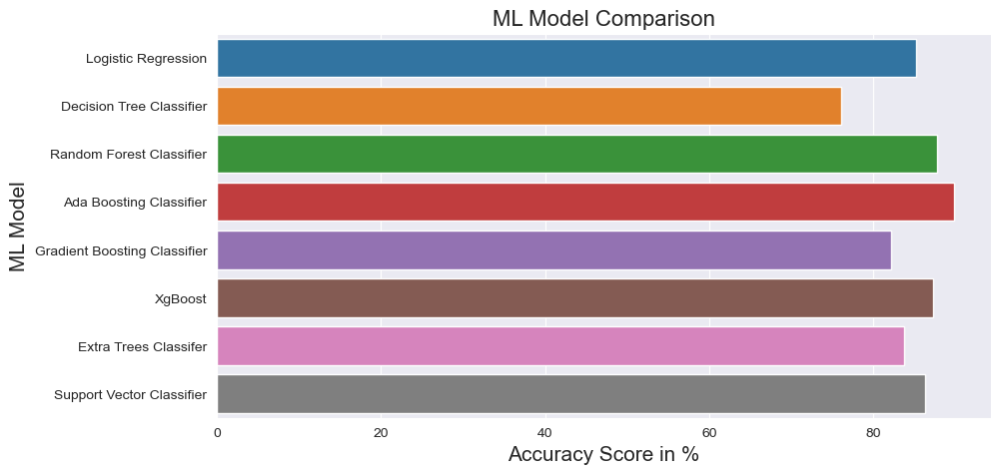

In [200]:
#Now focusing on the Accuracy Score....
plt.figure(figsize = (10, 5))
sns.set_style('darkgrid')

sns.barplot(x = 'Accuracy_Score', y = 'Model', data = models)

plt.xlabel('Accuracy Score in %', fontsize = 15)
plt.ylabel('ML Model', fontsize = 15)

plt.title('ML Model Comparison', fontsize = 16)

plt.show()

Now from the above diagram it seems that adaptive boost classifier(89.8%) has the highest Accuracy, However, our aim is to find the BEST MODEL, so if we consider the difference Between Accuracy_Score and Cross_Validation_Score....

# Step 6.1 - Comparing Differences between Accuracy and Cross_Validation Scores...

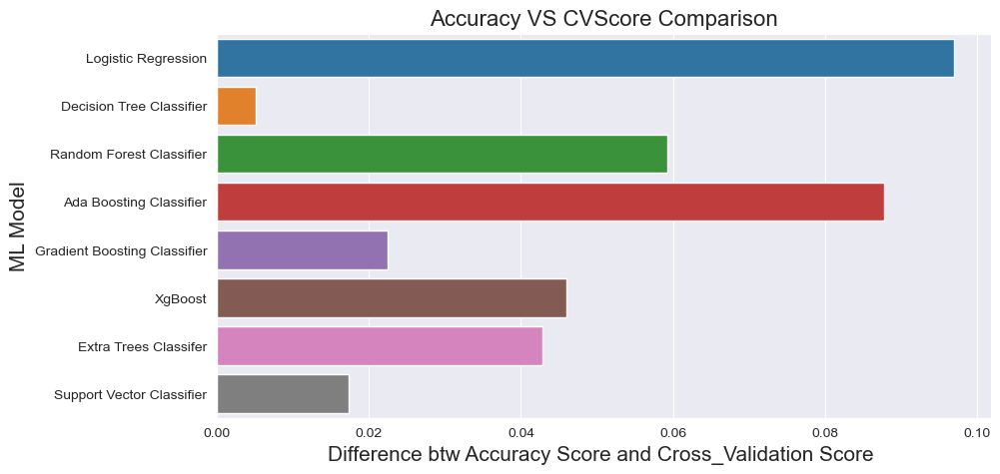

In [201]:
#Now focusing on the differnce btw Accuracy Score and Cross_Validation Scores
plt.figure(figsize = (10, 5))
sns.set_style('darkgrid')

sns.barplot(x = 'Accuracy_VS_CVScore', y = 'Model', data = models)

plt.xlabel('Difference btw Accuracy Score and Cross_Validation Score ', fontsize = 15)
plt.ylabel('ML Model', fontsize = 15)

plt.title('Accuracy VS CVScore Comparison', fontsize = 16)

plt.show()

From the above we can see the Model with least difference is Decision Tree Classifier!

# Step 6.2 - Conclusion on Choice of Model

From the above we can see:
 - The Model with least difference is Decision Tree Classifier!

# Hence Optimum Machine Model Chosen = Logistic Regression!

# Step 7 - HYPERPARAMETER TUNNING
 - Lets prepare list of parameters with options

In [202]:
param_grid = [    
    {'penalty' : ['l1', 'l2', 'elasticnet', 'none'],
    'C' : np.logspace(-10, 10, 20),
    'solver' : ['lbfgs','newton-cg','liblinear','sag','saga'],
    'max_iter' : [100, 1000,2500, 5000]
    }
]

In [203]:
#Gridsearch
gridsearch = GridSearchCV(lr, param_grid, cv=5,scoring="accuracy")
gridsearch.fit(x_train_ns, y_train_ns);

In [204]:
#Get best hyperparameters
gridsearch.best_params_

{'C': 0.026366508987303555,
 'max_iter': 100,
 'penalty': 'l1',
 'solver': 'liblinear'}

Now lets use the best parameters.....

In [205]:
#Instantiating using the best parameters...
lr = LogisticRegression(C = 0.026366508987303555,
 max_iter = 100,
 penalty = 'l2',
 solver = 'lbfgs')

In [206]:
#fitting the model...
lr.fit(x_train_ns,y_train_ns)

LogisticRegression(C=0.026366508987303555)

In [207]:
pred_test=lr.predict(x_test)

In [208]:
accuracy_score(y_test,pred_test)

0.8112244897959183

# Step 8 - ROC AUC PLOT

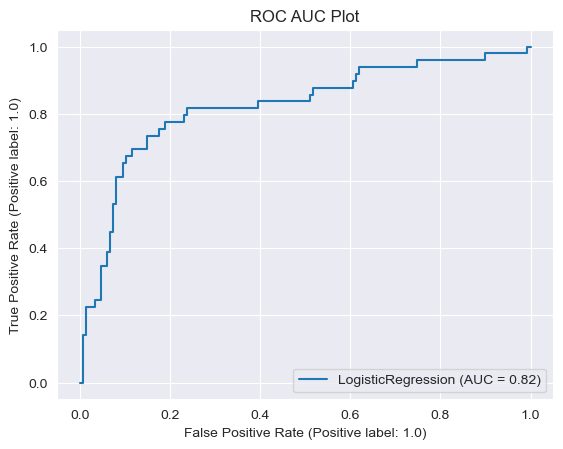

In [209]:
plot_roc_curve(lr,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

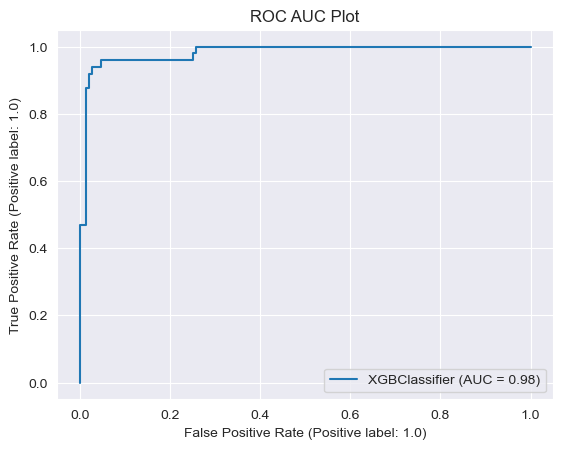

In [211]:
plot_roc_curve(xgb,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

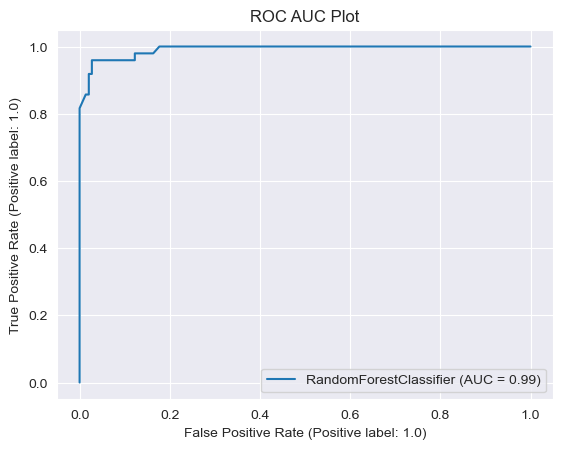

In [212]:
plot_roc_curve(rf,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

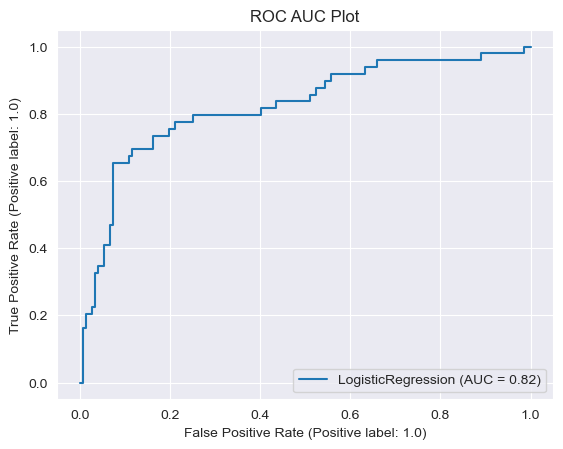

In [213]:
plot_roc_curve(dt,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

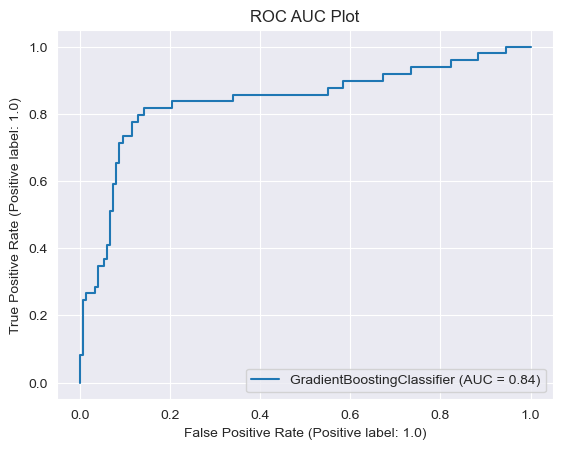

In [215]:
plot_roc_curve(sv,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

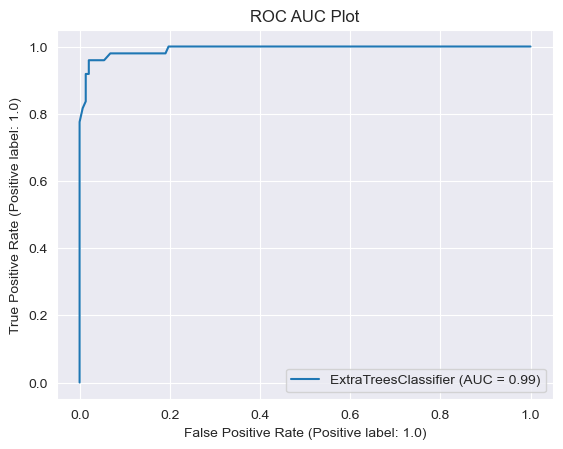

In [217]:
plot_roc_curve(ex,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

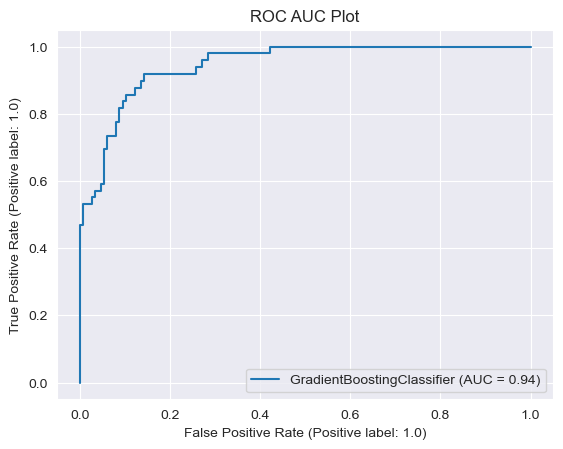

In [218]:
plot_roc_curve(gb,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

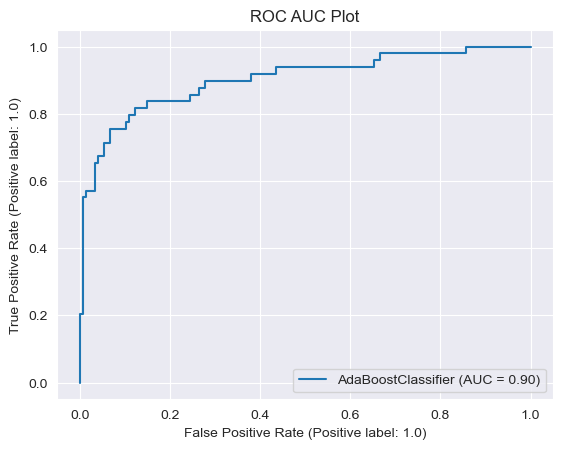

In [210]:
plot_roc_curve(ada,x_test,y_test)
plt.title("ROC AUC Plot")
plt.show()

From the above we can see:
- Final Accuracy is 79.40% and AUC Score is 86% 
- That the Logistic Regression Classifier has an AUC close to 1(i.e 0.86)

HENCE WE CAN CONCLUDE OUR MODEL IS PRETTY GOOD!!

# Step 9 - MODEL SAVING

In [227]:
filename='Machine_Model_Project_Insurance Claims- Fraud Detection'
pickle.dump(ada,open(filename,'wb'))

In [228]:
filename='Machine_Model_Project_Insurance Claims- Fraud Detection'
pickle.dump(lr,open(filename,'wb'))